**Reward Driven Workflow in Electron Microscopy**

* Reward Driven Workflow in Electron Microscopy
* Reward-Based Hyperparameter Tuning for Laplacian of Gaussian Method in Atom Finding
* Multi-Objective Bayesian Optimization

April, 2024

Notebook prepared by Kamyar Barakati

Nural network developed by Maxim Ziatdinov in AtomAI Python library

## Installation

In [ ]:
! pip install git+https://github.com/pycroscopy/atomai # install the latest version from source
! pip install gdown==4.6.2
! pip install --upgrade jax jaxlib
! pip install scikit-optimize scipy numpy
! pip install GPyOpt
! pip install platypus-opt
! pip install -q kornia atomai git+https://github.com/ziatdinovmax/pyroVED@main

  Cloning https://github.com/pycroscopy/atomai to /tmp/pip-req-build-l87r1i8v
  Running command git clone --filter=blob:none --quiet https://github.com/pycroscopy/atomai /tmp/pip-req-build-l87r1i8v
  Resolved https://github.com/pycroscopy/atomai to commit 8db3e944cd9ece68c33c8e3fcca3ef3ce9a111ea
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 1.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.1/266.1 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.6/175.6 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 41.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_c

## Imports

In [ ]:
import atomai as aoi
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import peak_local_max
from PIL import Image
from skopt.space import Real, Integer
from skimage import feature, io
import random
import cv2
import skimage
from sklearn.mixture import GaussianMixture
import numpy as np
from GPyOpt.methods import BayesianOptimization
import GPy
from platypus import Problem, Real, NSGAII, Solution
import time
import math
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage import distance_transform_edt
from atomai.transforms import datatransform
from sklearn import preprocessing
from sklearn.decomposition import PCA
from matplotlib.patches import Patch
from skimage.morphology import disk, dilation
from skimage.measure import label, regionprops
from torchvision.utils import make_grid
import torch
import pyroved as pv
tt = torch.tensor
np.random.seed(42)

## Prepared data

Download experimental image.

In [ ]:
!gdown 1DxFa0ra4TG88QFvuAVD9hyqbEJpE_w1S

Downloading...
From: https://drive.google.com/uc?id=1DxFa0ra4TG88QFvuAVD9hyqbEJpE_w1S
To: /content/YBCO.tif
100% 8.40M/8.40M [00:00<00:00, 138MB/s]


Load the pretrained DCNN model

In [ ]:
!gdown 1SYEhCvo2-Bdv37Od0VZohurlnm3LSWCB

Downloading...
From: https://drive.google.com/uc?id=1SYEhCvo2-Bdv37Od0VZohurlnm3LSWCB
To: /content/abc.tar
100% 7.21M/7.21M [00:00<00:00, 122MB/s]


Load the experimental image and select the region of interest for analysis.

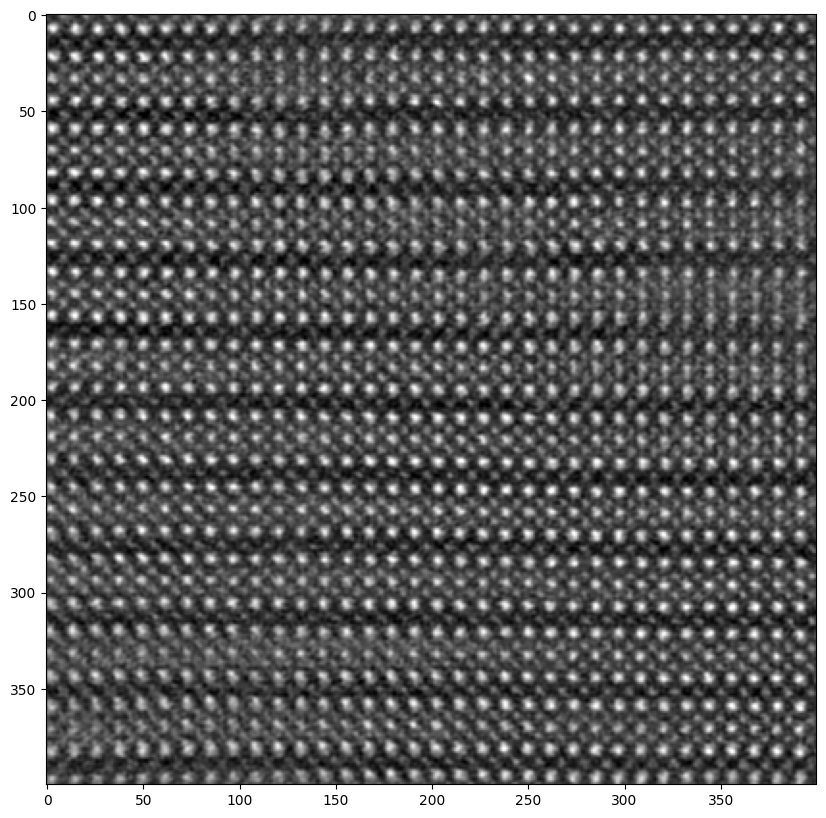

In [ ]:
# Load validation data (data from different experiment)
img = plt.imread('/content/YBCO.tif')
img_array = np.array(img[800:1200 , 800:1200])

plt.figure(figsize=(10, 10))
plt.imshow(img[800:1200 , 800:1200], cmap='gray') #twilight

# Reward Functions Definition

* Analysis of atoms via optimized LoG (optimizing for numbers via physical criterion)
* Analysis of atoms via DCNN

## Analysis of atoms via DCNN

Initializing the neural network model, referred to as **Oracle-A**

In [ ]:
model_load = aoi.load_model("/content/abc.tar")

Using neural network model to analyze a specific section of the image and extract two types of information from that section:

*   Decoded image
*   Atoms coordinates in the structure



In [ ]:
nn_output, coordinates = model_load.predict(img[800:1200 , 800:1200])

Batch 1/1
1 image was decoded in approximately 0.2742 seconds


Set **Oracle-A** to represent the count of atoms detected by the neural network

In [ ]:
Oracle_A = len(coordinates[0])

Display of atomic coordinates identified by the neural network on the experimental image structure.

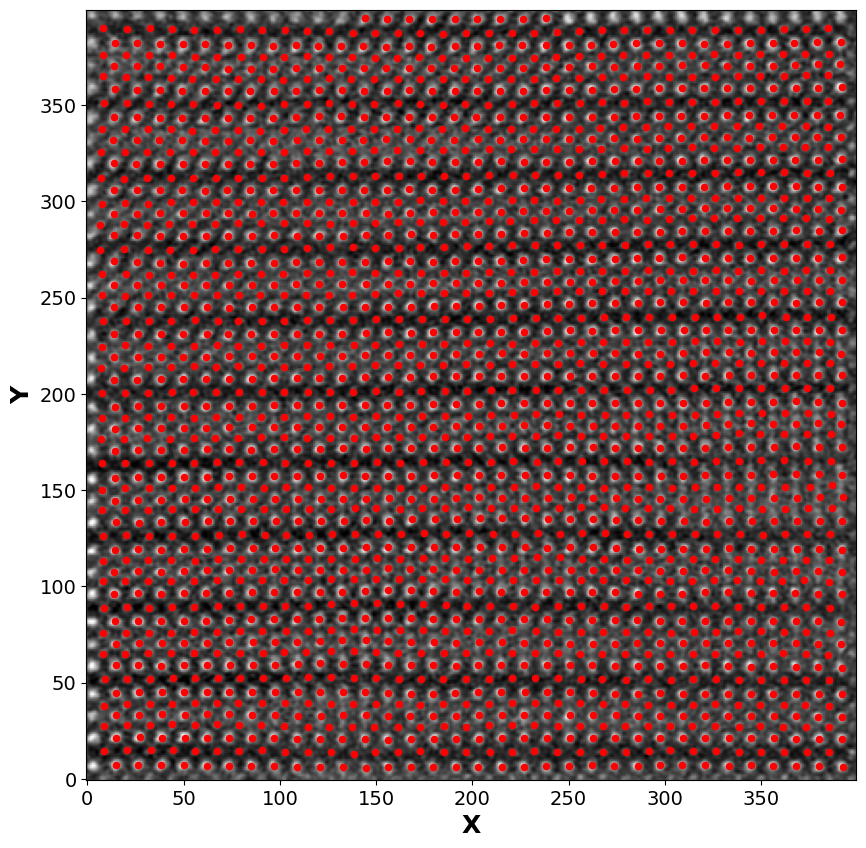

In [ ]:
NN_coord = coordinates
x = NN_coord[0][:, 1]  # All rows, first column
y = NN_coord[0][:, 0]  # All rows, second column
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

ax.imshow(img[800:1200 , 800:1200], cmap='gist_gray')

# Setting axis labels with a larger font size
ax.set_xlabel('X', fontsize=18, fontweight='bold')
ax.set_ylabel('Y', fontsize=18, fontweight='bold')

# Changing the tick size
ax.tick_params(axis='both', labelsize=14)

ax.invert_yaxis()
ax.scatter(x, y,  marker='o', c="r" , s = 20)

Normalizing data between 0 and 1 to ensure that the processing or learning algorithm behaves well and yields reliable results

Norm Function

In [ ]:
# min-max normalization:
def norm2d(img: np.ndarray) -> np.ndarray:
    return (img - np.min(img)) / (np.max(img) - np.min(img))

The function apply_log is designed to process an image to detect and analyze atomic structures using the Laplacian of Gaussian (LoG) method, particularly focusing on a subregion of the image.

It takes FOUR values as hyperparameter and returns number and coordinates of the detected atoms

*   min_sigma
*   max_sigma
*   Threshold
*   Overlap





In [ ]:
def apply_log(min_sigma, max_sigma, threshold, overlap):

    img = plt.imread('/content/YBCO.tif')
    preprocessed_img = norm2d(np.array(img[800:1200 , 800:1200]))
    array_3d = preprocessed_img[None, :, :]

    num_sigma = 30
    window_size = 20

    # Initialize arrays for results
    coordinates = np.zeros((1, 3))
    coms = np.zeros((1, 3))
    imstack_grid = np.zeros((1, window_size, window_size, 1))

    # Process the preprocessed image
    imglist = [0]  # Assuming you're processing a single image in this case
    for i in imglist:
        img_to_analyze = norm2d(array_3d[i])  # Apply norm2d to the slice from array_3d

        # Apply LoG filter to detect atoms using the provided parameters
        all_atoms = feature.blob_log(preprocessed_img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold, overlap=overlap)

        if len(all_atoms) == 0:
            return np.array([]), 0

        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        # Extract sub-images around detected atoms
        imstack, com, frames = aoi.utils.extract_subimages(img_to_analyze, coordinate[:, :-1], window_size)
        com_ = np.full((len(com), 3), i)
        com_[:, :-1] = com
        imstack = (imstack - imstack.min()) / (imstack.max() - imstack.min())  # Normalize sub-images

        # Accumulate results
        coms = np.concatenate((coms, com_), axis=0)
        coordinates = np.concatenate((coordinates, coordinate), axis=0)
        imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)

    # Remove the initial placeholder row
    coordinates = coordinates[1:]
    coms = coms[1:]
    imstack_grid = imstack_grid[1:]

    #return len(coordinates) #, len(imstack_grid)
    return coms , len(coms)

### Quality Function: Objective 1

The Quality_count function is designed to evaluate the performance Laplacian of Gaussian method in atom detection based on a comparison between the number of atoms detected by the apply_log function and a pre-established number of atoms acquired by Neural network, **Oracle_A**.

In [ ]:
def Quality_count(params):
    min_sigma, max_sigma, threshold, overlap = params
    coms, log_count = apply_log(min_sigma, max_sigma, threshold, overlap)

    difference = abs((log_count - Oracle_A)/Oracle_A)

    return difference

### Error Function: Objective 2

The Error_count function is designed to evaluate the clustering effectiveness of detected atoms based on their proximity to each other, using specific hyperparameters for the Laplacian of Gaussian (LoG) method.

It takes two values as hyperparameter and returns number of atoms without physical meaning in the YBCO structure

*   min_sigma
*   max_sigma
*   Threshold
*   Overlap

In [ ]:
def Error_count(params):
    min_sigma, max_sigma, threshold, overlap = params

    # Assume apply_log is defined elsewhere and returns coordinates and log_count
    coms, log_count = apply_log(min_sigma, max_sigma, threshold, overlap)

    # Safeguard for n_neighbors to not exceed number of samples
    n_neighbors = min(len(coms), 5)  # Ensure n_neighbors does not exceed the number of samples in coms

    # Calculate the sum of distances to the nearest neighbors for each point
    if n_neighbors > 1:  # Proceed only if there are at least 2 points (1 neighbor besides itself)
        nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(coms)
        distances, _ = nbrs.kneighbors(coms)
        sum_of_distances = np.sum(distances[:, 1:], axis=1)  # Exclude the distance to itself (first column)
    else:
        sum_of_distances = np.array([0] * len(coms))  # If only 1 sample, the sum of distances is 0

    # Count points with the sum of distances below a certain threshold
    points_below_threshold = np.sum(sum_of_distances < 30)

    normalized_points = points_below_threshold / Oracle_A  # Assuming Oracle_A is defined and non-zero

    return normalized_points

## Multi-Objective Optimization

The provided funcrions define and execute a multi-objective optimization problem using the **NSGA-II** algorithm. The main goal of this optimization is to minimize two objectives (Error_count, and Quality_count) by adjusting certain hyper-parameters (threshold, overlap).

In [ ]:
# Define your problem as a class inheriting from Problem
class MyOptimizationProblem(Problem):
    def __init__(self):
        # Initialize the problem with 4 decision variables and 2 objectives
        super(MyOptimizationProblem, self).__init__(4, 2)
        self.types[:] = [Real(0.1, 3.0), Real(1.0, 6.0), Real(0.01, 0.4), Real(0.01, 0.5)]

        self.directions[:] = [Problem.MINIMIZE, Problem.MINIMIZE]  # Assuming both objectives are to be minimized

    def evaluate(self, solution):
        #min_sigma, max_sigma, threshold, overlap = solution.variables
        min_sigma, max_sigma, threshold, overlap = solution.variables

        error = Error_count([min_sigma, max_sigma, threshold, overlap])
        quality = Quality_count([min_sigma, max_sigma, threshold, overlap])

        # Ensure the objectives are returned as a list or array of two values
        # Apply a penalty factor to the error objective
        penalty_factor = 10  # For example, a penalty factor of 2 makes the error twice as significant
        penalized_error = error * penalty_factor
        solution.objectives[:] = [penalized_error, quality]

        # Ensure the objectives are returned as a list or array of two values
        #solution.objectives[:] = [error, quality]

In [ ]:
# Instantiate the problem
problem = MyOptimizationProblem()

# Solve the problem using the NSGA-II algorithm
algorithm_A = NSGAII(problem)

start_time = time.time()  # Record the start time before running the algorithm
algorithm_A.run(10)  # Adjust the number of iterations as needed
end_time = time.time()  # Adjust the number of iterations as needed

duration = end_time - start_time
print(f"NSGA-II Algorithm run took {duration:.2f} seconds.")

# After the run, you can extract the Pareto-optimal solutions
for solution in algorithm_A.result:
    print(f"Objectives: {solution.objectives}, Parameters: {solution.variables}")

NSGA-II Algorithm run took 143.42 seconds.
Objectives: [0.0, 0.9138686131386862], Parameters: [0.6157012805150802, 3.716075404797831, 0.3916495178795629, 0.2600320782320212]
Objectives: [0.0, 0.570316301703163], Parameters: [1.280449786368549, 1.7107561699984837, 0.23698040151267766, 0.24304067515146896]
Objectives: [0.0, 0.7012165450121655], Parameters: [2.371267403015529, 1.929216168507108, 0.30457984749043626, 0.16494671152477644]
Objectives: [0.0, 0.6467153284671533], Parameters: [2.817022274430664, 4.603205212352491, 0.20139931743257392, 0.41246248269350827]
Objectives: [0.0, 0.5873479318734793], Parameters: [2.8591733104399863, 3.5666807416651842, 0.1656369165792808, 0.2987154626637962]
Objectives: [0.16058394160583941, 0.05596107055961071], Parameters: [1.6654093163701025, 2.2286811141130105, 0.04434160241567849, 0.03808096725816555]
Objectives: [0.0, 0.6627737226277373], Parameters: [2.5113532967138816, 3.2627023907843578, 0.24683617173652847, 0.2923428146267252]
Objectives: [0

Pareto Front Solutions Highlighted

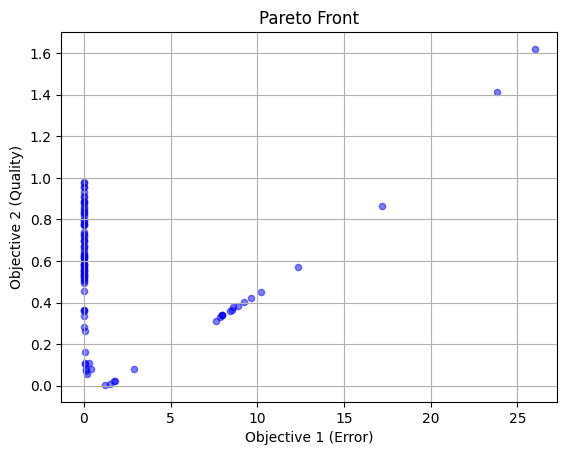

In [ ]:
solutions_A = algorithm_A.result
objectives_A = [s.objectives[:] for s in solutions_A]

# Separate objectives for plotting
obj1 = [o[0] for o in objectives_A]  # First objective
obj2 = [o[1] for o in objectives_A]  # Second objective

# Create scatter plot

plt.scatter(obj1, obj2, s=20, marker='o', c="blue", alpha=0.5)
#norm=None, vmin=None, vmax=None,
plt.xlabel('Objective 1 (Error)')
plt.ylabel('Objective 2 (Quality)')
plt.title('Pareto Front')
plt.grid(True)
plt.show()

Define two metrics to select a single solution from the set of Pareto optimal solutions, each incorporating a different perspective on what constitutes the "best" solution based on proximity to an ideal outcome.

* **Euclidean Distance**: Choose the solution with the minimum Euclidean distance to the ideal point.
* **Chebyshev Distance**: Choose the solution that minimizes the maximum deviation from the ideal point across all objectives.

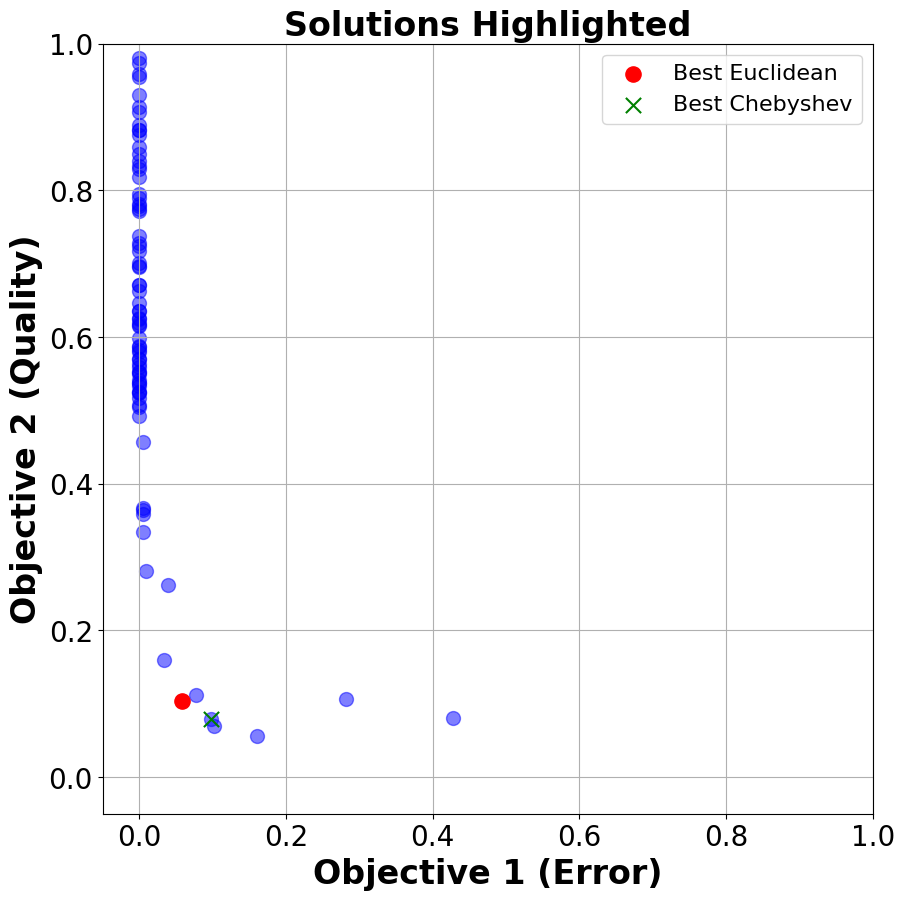

In [ ]:
# Given: solutions and objectives extraction from your algorithm's result
solutions_A = algorithm_A.result
objectives_A = [s.objectives[:] for s in solutions_A]

# Define your ideal point here
ideal_point = [0, 0]  # Replace ideal_obj1 and ideal_obj2 with your ideal values

# Calculate distances
euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives_A]
chebyshev_distances = [np.max(np.abs(np.array(obj) - np.array(ideal_point))) for obj in objectives_A]

# Find the best solutions based on distances
best_solution_euclidean_index = np.argmin(euclidean_distances)
best_solution_chebyshev_index = np.argmin(chebyshev_distances)

# Separate objectives for plotting
obj1 = [o[0] for o in objectives_A]
obj2 = [o[1] for o in objectives_A]

fig = plt.figure(figsize=(10, 10))

# Create scatter plot of the Pareto front
plt.scatter(obj1, obj2, s=100, marker='o', c="blue", alpha=0.5)
plt.scatter(obj1[best_solution_euclidean_index], obj2[best_solution_euclidean_index], color='red', label='Best Euclidean' , alpha=1, s = 120)
plt.scatter(obj1[best_solution_chebyshev_index], obj2[best_solution_chebyshev_index], color='green', label='Best Chebyshev', alpha=1, marker='x', s = 120)
# Create scatter plot

# Adding plot labels and title
plt.title('Solutions Highlighted', fontsize = 24, fontweight = "bold")
plt.xlabel('Objective 1 (Error)', fontsize = 24, fontweight = "bold")
plt.ylabel('Objective 2 (Quality)', fontsize = 24, fontweight = "bold")
plt.grid(True)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.xlim([-0.05, 1])  # Replace xmin and xmax with your desired values
plt.ylim([-0.05, 1])
plt.legend(prop={'size': 16})
plt.gca().set_aspect('equal', adjustable='box')
plt.show()


### TEST

Find the values of optimum solutions

In [ ]:
solutions_A[best_solution_euclidean_index]

# Retrieve the best solutions based on Euclidean and Chebyshev distances
best_solution_euclidean_A = solutions_A[best_solution_euclidean_index]
best_solution_chebyshev_A = solutions_A[best_solution_chebyshev_index]

# Extract the parameters from these solutions
best_parameters_euclidean_A = best_solution_euclidean_A.variables
best_parameters_chebyshev_A = best_solution_chebyshev_A.variables

# Print the best parameters for each method
print("Best Parameters based on Euclidean Distance:", best_parameters_euclidean_A)
print("Best Parameters based on Chebyshev Distance:", best_parameters_chebyshev_A)

Best Parameters based on Euclidean Distance: [1.877939607268308, 5.776085582546764, 0.05706511000595502, 0.4265732929430595]
Best Parameters based on Chebyshev Distance: [2.0346083484651993, 4.05195588647003, 0.030390620392530696, 0.28115630043709233]


In [ ]:
def plot_atoms_testing(min_sigma, max_sigma, threshold, overlap):

    # Load the image and convert to a numpy array
    img = Image.open('/content/YBCO.tif')
    img_array = np.array(img)

    # Normalize and crop the image section
    img = norm2d(img_array[1000:1200, 1000:1200])

    # Detect atoms using blob_log
    all_atoms = skimage.feature.blob_log(img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=30, threshold=threshold, overlap=overlap)

    # Set up the plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img, cmap='gist_gray')

    # Filter out atoms close to the boundary
    boundary_buffer = 5
    height, width = img.shape
    filtered_atoms = [atom for atom in all_atoms if (boundary_buffer <= atom[0] <= height - boundary_buffer) and (boundary_buffer <= atom[1] <= width - boundary_buffer)]

    # Convert the filtered list back to a NumPy array for plotting
    filtered_atoms = np.array(filtered_atoms)

    # Plotting settings
    ax.set_title('LoG-Optimized Detected Atoms', fontsize=20, fontweight='bold')
    ax.set_xlabel('X', fontsize=20, fontweight='bold')
    ax.set_ylabel('Y', fontsize=20, fontweight='bold')
    ax.tick_params(axis='both', labelsize=16)
    ax.invert_yaxis()
    ax.scatter(filtered_atoms[:, 1], filtered_atoms[:, 0], marker='o', c="red", s=30 )

    # Display the plot
    plt.show()

Call the test function using the optimum hyper-paramters

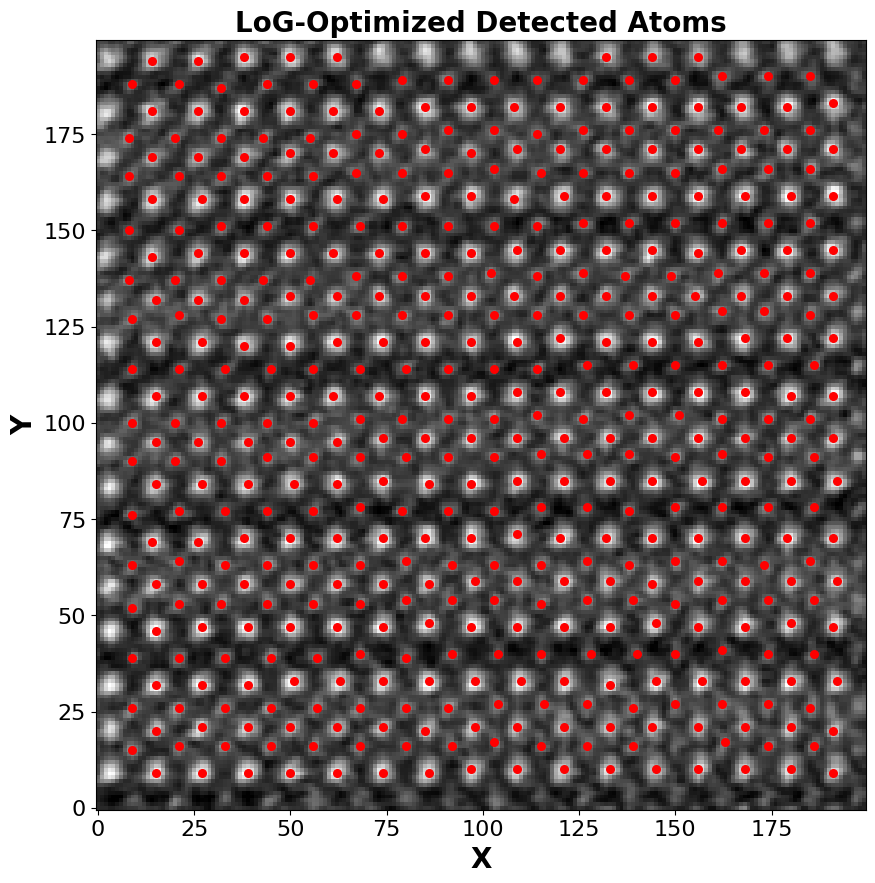

In [ ]:
# Example usage
plot_atoms_testing(best_parameters_euclidean_A[0], best_parameters_euclidean_A[1], best_parameters_euclidean_A[2], best_parameters_euclidean_A[3])

Laplacian of Gaussian verses Neural Network performance comparison

DEFINE THE IMAGE SIZE

In [ ]:
img = plt.imread('/content/YBCO.tif')
img_array = np.array(img[1000:1200 , 1000:1200])
best_parameters_euclidean_A[0], best_parameters_euclidean_A[1], best_parameters_euclidean_A[2], best_parameters_euclidean_A[3]

(1.877939607268308, 5.776085582546764, 0.05706511000595502, 0.4265732929430595)

Batch 1/1
1 image was decoded in approximately 0.0422 seconds


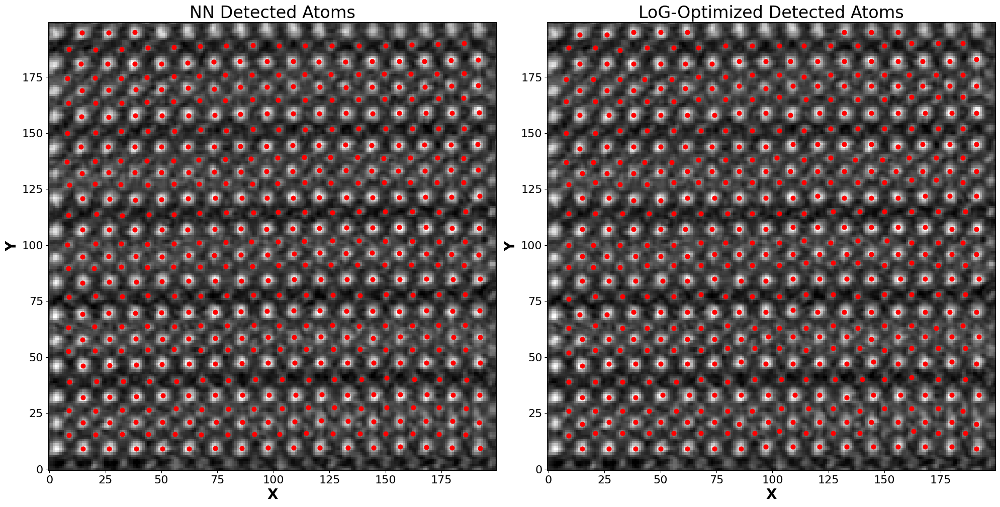

In [ ]:
# Prepare subplot figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

nn_output, coordinates = model_load.predict(img_array)
# First subplot for coordinates visualization
x = coordinates[0][:, 1]  # All rows, first column for x
y = coordinates[0][:, 0]  # All rows, second column for y
ax1.imshow(img_array, cmap='gist_gray')
ax1.scatter(x, y, marker='o', c="red", s=40)
ax1.set_xlabel('X', fontsize=20, fontweight='bold')
ax1.set_ylabel('Y', fontsize=20, fontweight='bold')
ax1.tick_params(axis='both', labelsize=16)
ax1.invert_yaxis()
ax1.set_title('NN Detected Atoms', fontsize=24)

# Detect atoms using blob_log
all_atoms = skimage.feature.blob_log(img_array, min_sigma=best_parameters_euclidean_A[0],
                                     max_sigma=best_parameters_euclidean_A[1],
                                     num_sigma=30,
                                     threshold=best_parameters_euclidean_A[2],
                                     overlap=best_parameters_euclidean_A[3])


# Filter out atoms close to the boundary
boundary_buffer = 5
height, width = img_array.shape
filtered_atoms = [atom for atom in all_atoms if (boundary_buffer <= atom[0] <= height - boundary_buffer) and (boundary_buffer <= atom[1] <= width - boundary_buffer)]
filtered_atoms = np.array(filtered_atoms)

# Second subplot for LoG detection visualization
ax2.imshow(img_array, cmap='gist_gray')
ax2.scatter(filtered_atoms[:, 1], filtered_atoms[:, 0], marker='o', c="red", s=40)
ax2.set_xlabel('X', fontsize=20, fontweight='bold')
ax2.set_ylabel('Y', fontsize=20, fontweight='bold')
ax2.tick_params(axis='both', labelsize=16)
ax2.invert_yaxis()
ax2.set_title('LoG-Optimized Detected Atoms', fontsize=24)

# Display the combined plots
plt.tight_layout()
plt.show()

## Analysis of atoms via optimized LoG (physical criterion)

In [ ]:
img = Image.open('/content/YBCO.tif')
# Convert the image to a NumPy array
img_array = np.array(img)
img = norm2d(img_array[800:1200 , 800:1200])

The function calculate_total_points estimates the total number of atoms in a cropped and normalized image by calculating how many unit cells fit in the image and then multiplying by the number of atoms per unit cell, adjusted by a 90% factor, referred to as **Oracle-B**

In [ ]:
def calculate_total_points(image, unit_cell_length, unit_cell_width, atoms_per_unit_cell):

    # Get the dimensions of the cropped and normalized image
    image_height, image_width = image.shape

    # Calculate the image area
    image_area = image_width * image_height

    # Calculate the unit cell area
    unit_cell_area = unit_cell_length * unit_cell_width

    # Determine the number of unit cells in the image
    number_of_unit_cells = image_area / unit_cell_area

    # Multiply by the number of atoms per unit cell
    total_points = (number_of_unit_cells * atoms_per_unit_cell)*0.9
    total_points = math.floor(total_points)
    return total_points

Define the unit cell and the approximate number of atoms within each unit cell

In [ ]:
unit_cell_length = 42
unit_cell_width = 15
atoms_per_unit_cell = 11

In [ ]:
# Calculate total points for the cropped and normalized image
total_points = calculate_total_points(img, unit_cell_length, unit_cell_width, atoms_per_unit_cell)

In [ ]:
Oracle_B = total_points

The function apply_log is designed to process an image to detect and analyze atomic structures using the Laplacian of Gaussian (LoG) method, particularly focusing on a subregion of the image.

It takes FOUR values as hyperparameter and returns number and coordinates of the detected atoms

*   min_sigma
*   max_sigma
*   Threshold
*   Overlap

In [ ]:
def apply_log(min_sigma, max_sigma, threshold, overlap):

    img = plt.imread('/content/YBCO.tif')
    preprocessed_img = norm2d(np.array(img[800:1200 , 800:1200]))
    array_3d = preprocessed_img[None, :, :]

    num_sigma = 30
    window_size = 20

    # Initialize arrays for results
    coordinates = np.zeros((1, 3))
    coms = np.zeros((1, 3))
    imstack_grid = np.zeros((1, window_size, window_size, 1))

    # Process the preprocessed image
    imglist = [0]  # Assuming you're processing a single image in this case
    for i in imglist:
        img_to_analyze = norm2d(array_3d[i])  # Apply norm2d to the slice from array_3d

        # Apply LoG filter to detect atoms using the provided parameters
        all_atoms = feature.blob_log(preprocessed_img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold, overlap=overlap)

        if len(all_atoms) == 0:
            return np.array([]), 0

        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        # Extract sub-images around detected atoms
        imstack, com, frames = aoi.utils.extract_subimages(img_to_analyze, coordinate[:, :-1], window_size)
        com_ = np.full((len(com), 3), i)
        com_[:, :-1] = com
        imstack = (imstack - imstack.min()) / (imstack.max() - imstack.min())  # Normalize sub-images

        # Accumulate results
        coms = np.concatenate((coms, com_), axis=0)
        coordinates = np.concatenate((coordinates, coordinate), axis=0)
        imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)

    # Remove the initial placeholder row
    coordinates = coordinates[1:]
    coms = coms[1:]
    imstack_grid = imstack_grid[1:]

    #return len(coordinates) #, len(imstack_grid)
    return coms , len(coms)

### Quality Function: Objective 1

The Quality_count function is designed to evaluate the performance Laplacian of Gaussian method in atom detection based on a comparison between the number of atoms detected by the apply_log function and a pre-established number of atoms acquired by Neural network, **Oracle_B**.

In [ ]:
def Quality_count(params):
    min_sigma, max_sigma, threshold, overlap = params
    coms, log_count = apply_log(min_sigma, max_sigma, threshold, overlap)

    difference = abs((log_count - Oracle_B)/Oracle_B)

    return difference

### Error Function: Objective 2

The Error_count function is designed to evaluate the clustering effectiveness of detected atoms based on their proximity to each other, using specific hyperparameters for the Laplacian of Gaussian (LoG) method.

It takes two values as hyperparameter and returns number of atoms without physical meaning in the YBCO structure

*   min_sigma
*   max_sigma
*   Threshold
*   Overlap

In [ ]:
def Error_count(params):
    min_sigma, max_sigma, threshold, overlap = params

    # Assume apply_log is defined elsewhere and returns coordinates and log_count
    coms, log_count = apply_log(min_sigma, max_sigma, threshold, overlap)

    # Safeguard for n_neighbors to not exceed number of samples
    n_neighbors = min(len(coms), 5)  # Ensure n_neighbors does not exceed the number of samples in coms

    # Calculate the sum of distances to the nearest neighbors for each point
    if n_neighbors > 1:  # Proceed only if there are at least 2 points (1 neighbor besides itself)
        nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(coms)
        distances, _ = nbrs.kneighbors(coms)
        sum_of_distances = np.sum(distances[:, 1:], axis=1)  # Exclude the distance to itself (first column)
    else:
        sum_of_distances = np.array([0] * len(coms))  # If only 1 sample, the sum of distances is 0

    # Count points with the sum of distances below a certain threshold
    points_below_threshold = np.sum(sum_of_distances < 30)

    normalized_points = points_below_threshold / Oracle_B  # Assuming Oracle_A is defined and non-zero

    return normalized_points

## Multi-Objective Optimization

The provided funcrions define and execute a multi-objective optimization problem using the **NSGA-II** algorithm. The main goal of this optimization is to minimize two objectives (Error_count, and Quality_count) by adjusting certain hyper-parameters (threshold, overlap).

In [ ]:
# Define your problem as a class inheriting from Problem
class MyOptimizationProblem(Problem):
    def __init__(self):
        # Initialize the problem with 4 decision variables and 2 objectives
        super(MyOptimizationProblem, self).__init__(4, 2)
        self.types[:] = [Real(0.1, 3.0), Real(1.0, 6.0), Real(0.01, 0.4), Real(0.01, 0.5)]

        self.directions[:] = [Problem.MINIMIZE, Problem.MINIMIZE]  # Assuming both objectives are to be minimized

    def evaluate(self, solution):
        #min_sigma, max_sigma, threshold, overlap = solution.variables
        min_sigma, max_sigma, threshold, overlap = solution.variables

        error = Error_count([min_sigma, max_sigma, threshold, overlap])
        quality = Quality_count([min_sigma, max_sigma, threshold, overlap])

        # Ensure the objectives are returned as a list or array of two values
        # Apply a penalty factor to the error objective
        penalty_factor = 10  # For example, a penalty factor of 2 makes the error twice as significant
        penalized_error = error * penalty_factor
        solution.objectives[:] = [penalized_error, quality]

        # Ensure the objectives are returned as a list or array of two values
        #solution.objectives[:] = [error, quality]

In [ ]:
# Instantiate the problem
problem = MyOptimizationProblem()

# Solve the problem using the NSGA-II algorithm
algorithm_B = NSGAII(problem)

start_time = time.time()  # Record the start time before running the algorithm
algorithm_B.run(10)  # Adjust the number of iterations as needed
end_time = time.time()  # Adjust the number of iterations as needed

duration = end_time - start_time
print(f"NSGA-II Algorithm run took {duration:.2f} seconds.")

# After the run, you can extract the Pareto-optimal solutions
for solution in algorithm_B.result:
    print(f"Objectives: {solution.objectives}, Parameters: {solution.variables}")

NSGA-II Algorithm run took 138.58 seconds.
Objectives: [0.0, 0.7541766109785203], Parameters: [0.7444165674701997, 3.8063595320606964, 0.3085200787980755, 0.2632474317731459]
Objectives: [0.0, 0.8476531424025457], Parameters: [1.593939417962345, 2.8892187266522393, 0.35325533621329414, 0.15642966171452022]
Objectives: [0.0, 0.9041368337311058], Parameters: [1.14544824687192, 2.024304280616011, 0.3785723146856353, 0.37399041859877047]
Objectives: [6.4359586316626896, 0.08870326173428798], Parameters: [0.19522361653680087, 4.42839645445323, 0.33711418175982877, 0.4960807247350752]
Objectives: [0.0, 0.6352426412092284], Parameters: [2.8693722552569914, 1.5904660751252822, 0.2147564315620604, 0.07643050908043827]
Objectives: [6.734287987271282, 0.10700079554494829], Parameters: [0.27385123939283773, 3.516236559780831, 0.21049405321211878, 0.34641709478626703]
Objectives: [0.027844073190135245, 0.3146380270485282], Parameters: [1.7776807609810565, 5.517042683126666, 0.08240113780076185, 0.3

Pareto Front Solutions Highlighted

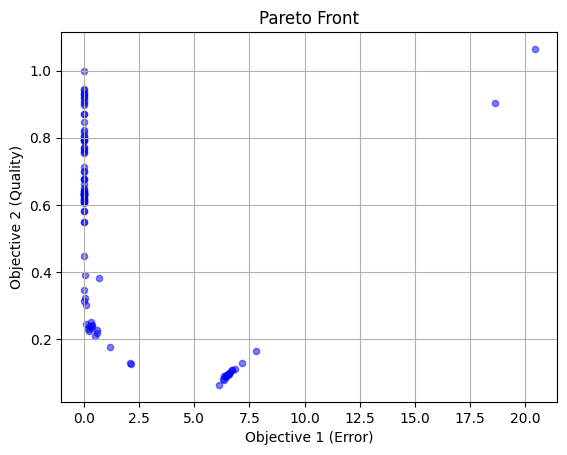

In [ ]:
solutions_B = algorithm_B.result
objectives_B = [s.objectives[:] for s in solutions_B]

# Separate objectives for plotting
obj1 = [o[0] for o in objectives_B]  # First objective
obj2 = [o[1] for o in objectives_B]  # Second objective

# Create scatter plot

plt.scatter(obj1, obj2, s=20, marker='o', c="blue", alpha=0.5)
#norm=None, vmin=None, vmax=None,
plt.xlabel('Objective 1 (Error)')
plt.ylabel('Objective 2 (Quality)')
plt.title('Pareto Front')
plt.grid(True)
plt.show()

Define two metrics to select a single solution from the set of Pareto optimal solutions, each incorporating a different perspective on what constitutes the "best" solution based on proximity to an ideal outcome.

* **Euclidean Distance**: Choose the solution with the minimum Euclidean distance to the ideal point.
* **Chebyshev Distance**: Choose the solution that minimizes the maximum deviation from the ideal point across all objectives.

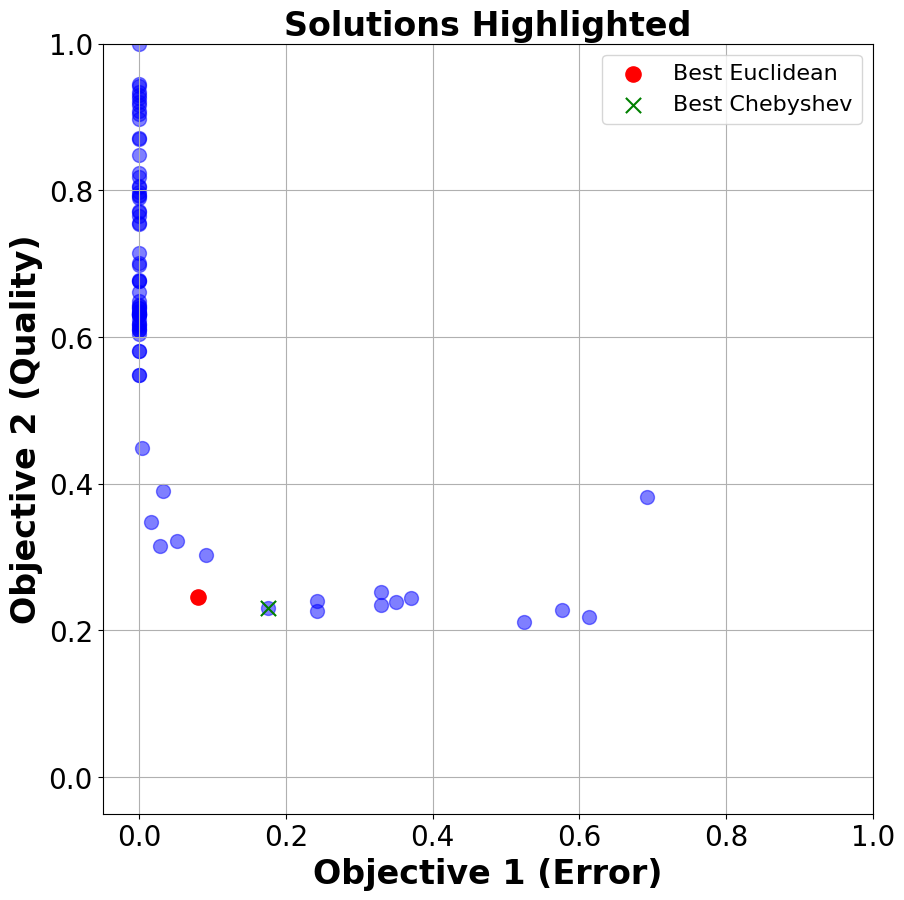

In [ ]:
# Given: solutions and objectives extraction from your algorithm's result
solutions_B = algorithm_B.result
objectives_B = [s.objectives[:] for s in solutions_B]

# Define your ideal point here
ideal_point = [0, 0]  # Replace ideal_obj1 and ideal_obj2 with your ideal values

# Calculate distances
euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives_B]
chebyshev_distances = [np.max(np.abs(np.array(obj) - np.array(ideal_point))) for obj in objectives_B]

# Find the best solutions based on distances
best_solution_euclidean_index = np.argmin(euclidean_distances)
best_solution_chebyshev_index = np.argmin(chebyshev_distances)

# Separate objectives for plotting
obj1 = [o[0] for o in objectives_B]
obj2 = [o[1] for o in objectives_B]

fig = plt.figure(figsize=(10, 10))

# Create scatter plot of the Pareto front
plt.scatter(obj1, obj2, s=100, marker='o', c="blue", alpha=0.5)
plt.scatter(obj1[best_solution_euclidean_index], obj2[best_solution_euclidean_index], color='red', label='Best Euclidean' , alpha=1, s = 120)
plt.scatter(obj1[best_solution_chebyshev_index], obj2[best_solution_chebyshev_index], color='green', label='Best Chebyshev', alpha=1, marker='x', s = 120)
# Create scatter plot

# Adding plot labels and title
plt.title('Solutions Highlighted', fontsize = 24, fontweight = "bold")
plt.xlabel('Objective 1 (Error)', fontsize = 24, fontweight = "bold")
plt.ylabel('Objective 2 (Quality)', fontsize = 24, fontweight = "bold")
plt.grid(True)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.xlim([-0.05, 1])  # Replace xmin and xmax with your desired values
plt.ylim([-0.05, 1])
plt.legend(prop={'size': 16})
plt.gca().set_aspect('equal', adjustable='box')
plt.show()


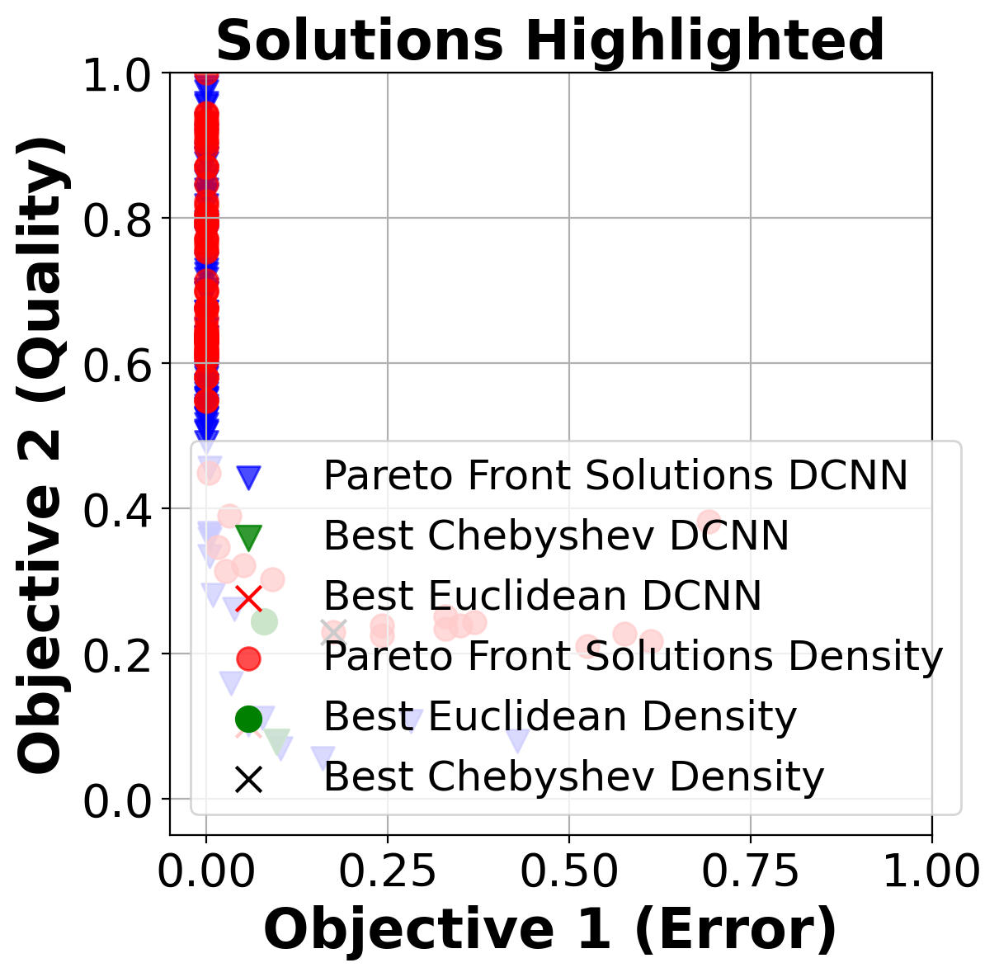

In [ ]:
# First block data extraction
solutions_1 = solutions_A
solutions_1 = algorithm_A.result  # Placeholder for actual solutions from the first block
objectives_1 = [s.objectives[:] for s in solutions_1]  # Objectives from the first block

# Distances calculation for the first block
ideal_point_1 = [0, 0]

euclidean_distances_1 = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point_1)) ** 2)) for obj in objectives_1]
chebyshev_distances_1 = [np.max(np.abs(np.array(obj) - np.array(ideal_point_1))) for obj in objectives_1]

# Best solutions based on distances for the first block
best_solution_euclidean_index_1 = np.argmin(euclidean_distances_1)
best_solution_chebyshev_index_1 = np.argmin(chebyshev_distances_1)

# Objectives separation for plotting the first block
obj1_1 = [o[0] for o in objectives_1]
obj2_1 = [o[1] for o in objectives_1]

# Second block data extraction
solutions_2 = solutions_B
solutions_2 = algorithm_B.result  # Placeholder for actual solutions from the second block
objectives_2 = [s.objectives[:] for s in solutions_2]  # Objectives from the second block

# Distances calculation for the second block
ideal_point_2 = [0, 0]


euclidean_distances_2 = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point_2)) ** 2)) for obj in objectives_2]
chebyshev_distances_2 = [np.max(np.abs(np.array(obj) - np.array(ideal_point_2))) for obj in objectives_2]

# Best solutions based on distances for the second block
best_solution_euclidean_index_2 = np.argmin(euclidean_distances_2)
best_solution_chebyshev_index_2 = np.argmin(chebyshev_distances_2)

# Objectives separation for plotting the second block
obj1_2 = [o[0] for o in objectives_2]
obj2_2 = [o[1] for o in objectives_2]

# Plotting both blocks on one figure
fig, ax = plt.subplots(figsize=(6, 6), dpi = 200)

# Plotting first block
ax.scatter(obj1_1, obj2_1, s=100, marker='v', c="blue", alpha=0.7, label='Pareto Front Solutions DCNN')
ax.scatter(obj1_1[best_solution_chebyshev_index_1], obj2_1[best_solution_chebyshev_index_1], color='green', label='Best Chebyshev DCNN', alpha=0.8, marker='v', s=120)
ax.scatter(obj1_1[best_solution_euclidean_index_1], obj2_1[best_solution_euclidean_index_1], color='red', label='Best Euclidean DCNN', alpha=1, marker='x', s=120)

# Plotting second block
ax.scatter(obj1_2, obj2_2, s=100, marker='o', c="red", alpha=0.7, label='Pareto Front Solutions Density')
ax.scatter(obj1_2[best_solution_euclidean_index_2], obj2_2[best_solution_euclidean_index_2], color='green', label='Best Euclidean Density', alpha=1, s=120)
ax.scatter(obj1_2[best_solution_chebyshev_index_2], obj2_2[best_solution_chebyshev_index_2], color='black', label='Best Chebyshev Density', alpha=1, marker='x',   s=120)

# Setting labels, title, and legend
# Adding plot labels and title
plt.title('Solutions Highlighted', fontsize = 24, fontweight = "bold")
plt.xlabel('Objective 1 (Error)', fontsize = 24, fontweight = "bold")
plt.ylabel('Objective 2 (Quality)', fontsize = 24, fontweight = "bold")
plt.grid(True)
plt.tick_params(axis='both', which='major', labelsize=20)
ax.legend(prop={'size': 18})

# Adjusting plot limits and aspect ratio
ax.set_xlim([-0.05, 1])
ax.set_ylim([-0.05, 1])
ax.set_aspect('equal', adjustable='box')

plt.show()

### TEST

Find the values of optimum solutions

In [ ]:
solutions_B[best_solution_euclidean_index]

# Retrieve the best solutions based on Euclidean and Chebyshev distances
best_solution_euclidean_B = solutions_B[best_solution_euclidean_index]
best_solution_chebyshev_B = solutions_B[best_solution_chebyshev_index]

# Extract the parameters from these solutions
best_parameters_euclidean_B = best_solution_euclidean_B.variables
best_parameters_chebyshev_B = best_solution_chebyshev_B.variables

# Print the best parameters for each method
print("Best Parameters based on Euclidean Distance:", best_parameters_euclidean_B)
print("Best Parameters based on Chebyshev Distance:", best_parameters_chebyshev_B)

Best Parameters based on Euclidean Distance: [2.0475607757639978, 3.442486618221423, 0.028297561313523553, 0.31055689204372905]
Best Parameters based on Chebyshev Distance: [1.5408791129010848, 2.655063493133092, 0.05615864054669179, 0.1589119283557897]


In [ ]:
def plot_atoms_testing(min_sigma, max_sigma, threshold, overlap):

    # Load the image and convert to a numpy array
    img = Image.open('/content/YBCO.tif')
    img_array = np.array(img)

    # Normalize and crop the image section
    img = norm2d(img_array[1000:1200, 1000:1200])

    # Detect atoms using blob_log
    all_atoms = skimage.feature.blob_log(img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=30, threshold=threshold, overlap=overlap)

    # Set up the plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(img, cmap='gist_gray')

    # Filter out atoms close to the boundary
    boundary_buffer = 5
    height, width = img.shape
    filtered_atoms = [atom for atom in all_atoms if (boundary_buffer <= atom[0] <= height - boundary_buffer) and (boundary_buffer <= atom[1] <= width - boundary_buffer)]

    # Convert the filtered list back to a NumPy array for plotting
    filtered_atoms = np.array(filtered_atoms)

    # Plotting settings
    ax.set_title('LoG-Optimized Detected Atoms', fontsize=20, fontweight='bold')
    ax.set_xlabel('X', fontsize=20, fontweight='bold')
    ax.set_ylabel('Y', fontsize=20, fontweight='bold')
    ax.tick_params(axis='both', labelsize=16)
    ax.invert_yaxis()
    ax.scatter(filtered_atoms[:, 1], filtered_atoms[:, 0], marker='o', c="red", s=30 )

    # Display the plot
    plt.show()

Call the test function using the optimum hyper-paramters

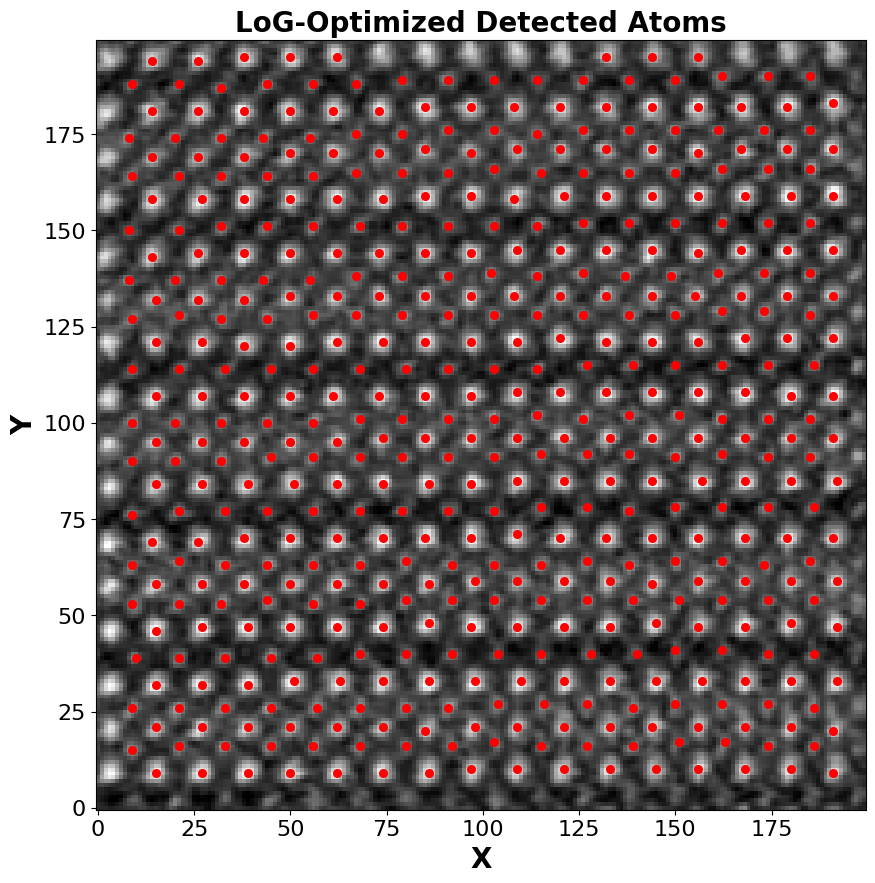

In [ ]:
# Example usage
plot_atoms_testing(best_parameters_euclidean_B[0], best_parameters_euclidean_B[1], best_parameters_euclidean_B[2], best_parameters_euclidean_B[3])

# Stability vs Noise interference

Load the Image

In [ ]:
img = plt.imread('/content/YBCO.tif')
img_array = np.array(img)

In [ ]:
# Define part of the image use want to simulate noise on
start_row, end_row = 1000, 1100
start_col, end_col = 1000, 1100

This function simulate_noise_on_image and returns a list of images with different applied level of noise on them.



In [ ]:
def simulate_noise_on_image(image):

    nn_outputs = []
    coordinates_list = []
    normalized_gauss_noise_levels = []  # List to store the normalized noise levels
    img_noise_list = []  # List to store the image noises for each level

    total_range = 1000
    step_size = 100

    # Number of steps in the loop
    num_steps = total_range // step_size + 1  # +1 to include the endpoint

    # Loop over the desired Gaussian noise levels, normalized
    for i in range(num_steps):
        # Normalize the current step (i) to a value between 0 and 1
        normalized_gauss_noise_level = i / (num_steps - 1)

        # Scale the normalized value back to the original range for actual noise level
        gauss_noise_level = int(normalized_gauss_noise_level * total_range)

        # Update the data transform object with the scaled noise level
        imaug = datatransform(
            dim_order_in='channel_last', dim_order_out='channel_first',
            gauss_noise=[gauss_noise_level, gauss_noise_level + 1],  # Use the scaled noise level
            squeeze_channels=True, seed=42)

        # Run the augmentation with the dummy 'targets'
        img_Noise, _ = imaug.run(image[None], np.zeros([1, image.shape[0], image.shape[1], 1]))

        # Use the model to predict on the augmented image section
        nn_output, coordinates = model_load.predict(img_Noise[0, 0, start_row:end_row, start_col:end_col])

        # Store the results
        nn_outputs.append(nn_output)
        coordinates_list.append(coordinates[0])
        normalized_gauss_noise_levels.append(normalized_gauss_noise_level)  # Save the normalized level
        img_noise_list.append(img_Noise)

    return nn_outputs, coordinates_list, normalized_gauss_noise_levels, img_noise_list

In [ ]:
nn_outputs, coordinates_list, normalized_gauss_noise_levels, img_noise_list = simulate_noise_on_image(img_array)

Batch 1/1
1 image was decoded in approximately 0.0363 seconds
Batch 1/1
1 image was decoded in approximately 0.0211 seconds
Batch 1/1
1 image was decoded in approximately 0.0212 seconds
Batch 1/1
1 image was decoded in approximately 0.0216 seconds
Batch 1/1
1 image was decoded in approximately 0.0204 seconds
Batch 1/1
1 image was decoded in approximately 0.0206 seconds
Batch 1/1
1 image was decoded in approximately 0.0165 seconds
Batch 1/1
1 image was decoded in approximately 0.0168 seconds
Batch 1/1
1 image was decoded in approximately 0.0176 seconds
Batch 1/1
1 image was decoded in approximately 0.0172 seconds
Batch 1/1
1 image was decoded in approximately 0.0174 seconds


Show an example

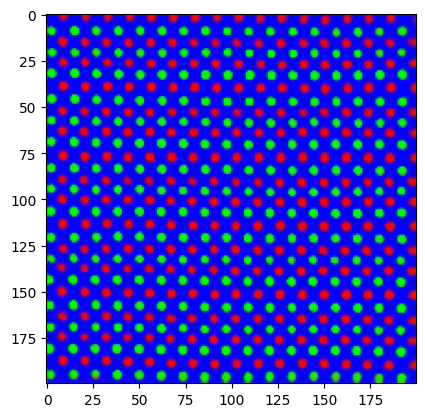

In [ ]:
plt.imshow(nn_output[0,:,:])

## DCNN vs Noise

Number of detected atoms versus **Gaussian noise level** using a (**DCNN**) detection method.

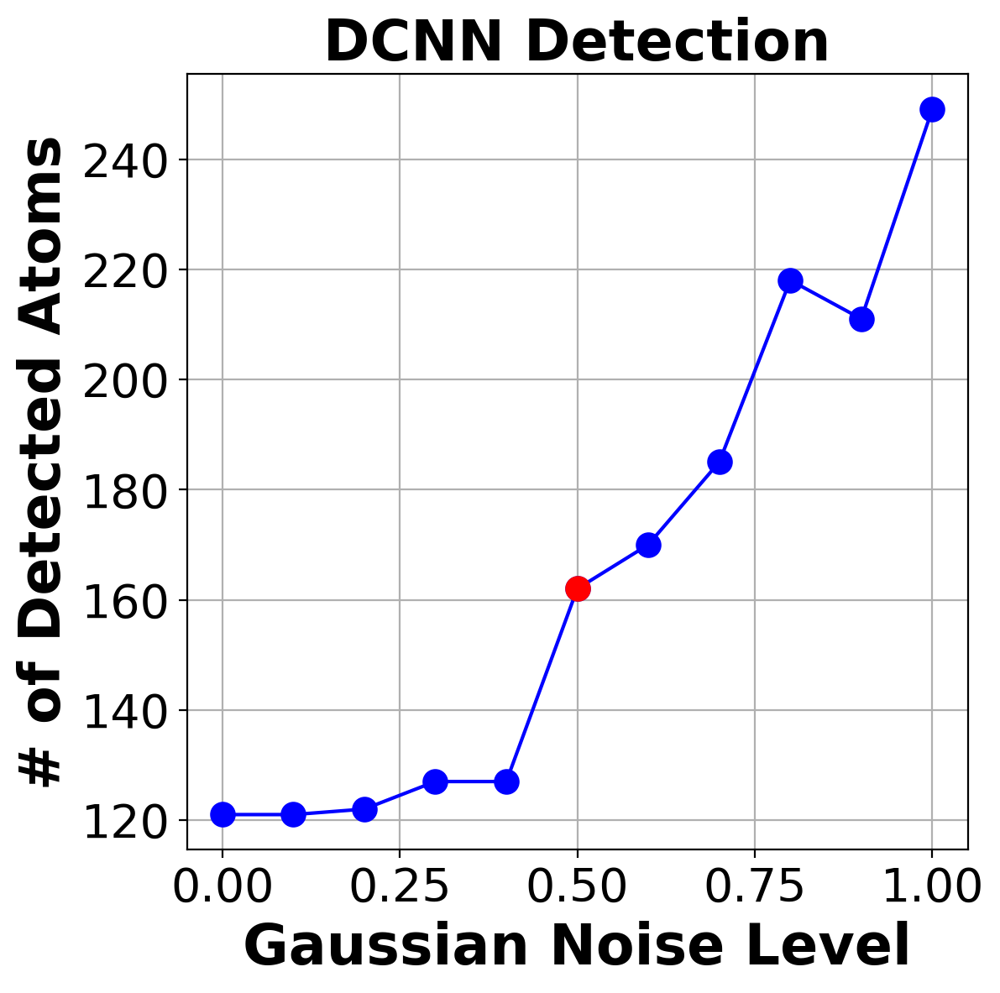

In [ ]:
coordinates_list_len = [len(coordinates) for coordinates in coordinates_list]

plt.figure(figsize=(6, 6), dpi = 200)
plt.plot(normalized_gauss_noise_levels, coordinates_list_len, marker='o', linestyle='-', color='b', markersize = 10)
plt.scatter(normalized_gauss_noise_levels[5], coordinates_list_len[5], color='red', s=100, label='Index 5', zorder=5)
plt.title('DCNN Detection', fontsize = 24 , fontweight ="bold")
plt.xlabel('Gaussian Noise Level', fontsize = 24 , fontweight ="bold")
plt.ylabel('# of Detected Atoms', fontsize = 24 , fontweight ="bold")
plt.tick_params(axis='both', which='major', labelsize=20)
plt.grid(True)
plt.show()

Presentation of the Neural network performance vs Noise On the image substrate

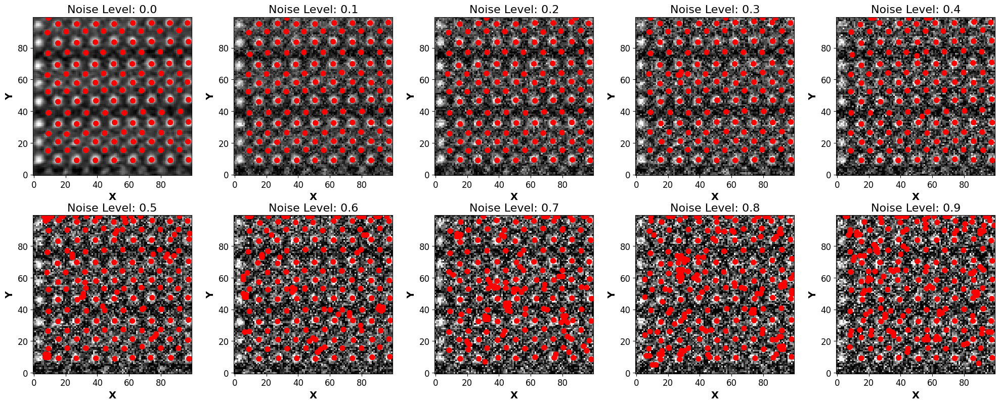

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # 2 rows, 5 columns of plots

for i, ax in enumerate(axes.flatten()):
    if i < len(coordinates_list):
        x = coordinates_list[i][:, 1]  # All rows, first column
        y = coordinates_list[i][:, 0]  # All rows, second column

        # Display the image
        ax.imshow(img_noise_list[i][0, 0, 1000:1100, 1000:1100], cmap='gist_gray')

        # Scatter plot of coordinates on the image
        ax.scatter(x, y, marker='o', c="r", s=50)

        # Setting axis labels with a larger font size
        ax.set_xlabel('X', fontsize=14, fontweight='bold')
        ax.set_ylabel('Y', fontsize=14, fontweight='bold')

        # Changing the tick size
        ax.tick_params(axis='both', labelsize=12)

        # Inverting y-axis to match image coordinates
        ax.invert_yaxis()

        # Setting title to indicate the noise level
        ax.set_title(f'Noise Level: {normalized_gauss_noise_levels[i]}', fontsize=16)
    else:
        ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()

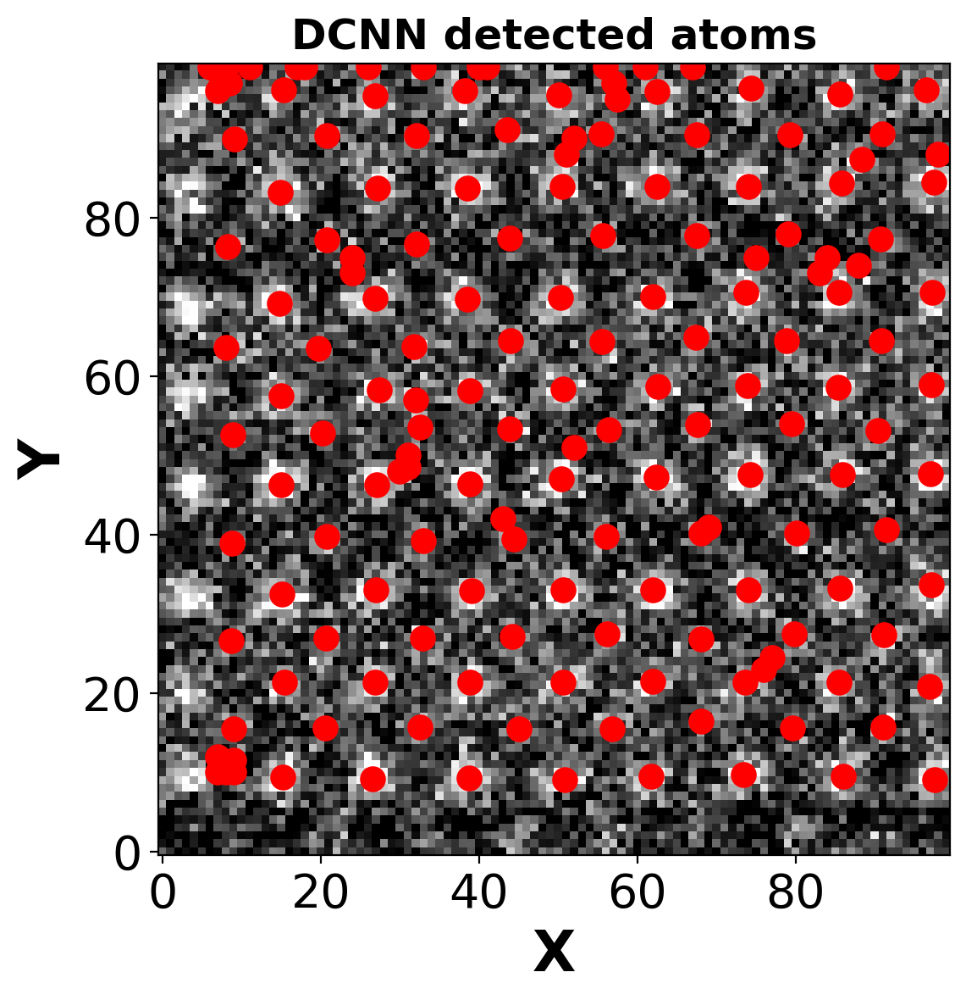

In [ ]:
i = 5
fig, ax = plt.subplots(figsize=(6, 6), dpi = 200)  # Create a new figure with a single subplot

x = coordinates_list[i][:, 1]  # All rows, first column
y = coordinates_list[i][:, 0]  # All rows, second column

# Display the image
ax.imshow(img_noise_list[i][0, 0, 1000:1100, 1000:1100], cmap='gist_gray')

# Scatter plot of coordinates on the image
ax.scatter(x, y, marker='o', c="r", s=100)

# Setting axis labels with a larger font size
ax.set_xlabel('X', fontsize=24, fontweight='bold')
ax.set_ylabel('Y', fontsize=24, fontweight='bold')


# Changing the tick size
ax.tick_params(axis='both', labelsize=20)

# Inverting y-axis to match image coordinates
ax.invert_yaxis()

# Setting title to indicate the noise level
ax.set_title('DCNN detected atoms', fontsize=18, fontweight='bold')

plt.tight_layout()
plt.show()

## LoG vs noise

Cropping the img_noise_list into interested sizes

In [ ]:
cropped_images_noise_list = []

for image in img_noise_list:
    # Assuming the image is a numpy array and has dimensions [Channels, Height, Width] or [Batch, Channels, Height, Width]
    # We check if there's an extra batch dimension and handle accordingly
    if image.ndim == 4:
        cropped_image = image[:, :, 1000:1100, 1000:1100]
    elif image.ndim == 3:
        cropped_images_noise_list = image[:, 1000:1100, 1000:1100]
    else:
        raise ValueError("Image dimensions are not compatible. Expected 3 or 4 dimensions, got {}".format(image.ndim))

    cropped_images_noise_list.append(cropped_image)

In [ ]:
cropped_images_noise_list[1].shape

(1, 1, 100, 100)

In [ ]:
squeezed_images = [np.squeeze(img) for img in cropped_images_noise_list]
squeezed_images[1].shape

(100, 100)

Define the Oracle_A for the selected image size

In [ ]:
img = plt.imread('/content/YBCO.tif')
nn_output, coordinates = model_load.predict(img[1000:1100 , 1000:1100])
Oracle_A = len(coordinates[0])

Batch 1/1
1 image was decoded in approximately 0.0163 seconds


Running the reward driven algorithm for each image with different level of noise

In [ ]:
def apply_log(image, min_sigma, max_sigma, threshold, overlap):

    preprocessed_img = norm2d(image)
    array_3d = preprocessed_img[None, :, :]

    num_sigma = 30
    window_size = 20

    # Initialize arrays for results
    coordinates = np.zeros((1, 3))
    coms = np.zeros((1, 3))
    imstack_grid = np.zeros((1, window_size, window_size, 1))

    # Process the preprocessed image
    imglist = [0]  # Assuming you're processing a single image in this case
    for i in imglist:
        img_to_analyze = norm2d(array_3d[i])  # Apply norm2d to the slice from array_3d

        # Apply LoG filter to detect atoms using the provided parameters
        all_atoms = feature.blob_log(preprocessed_img, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold, overlap=overlap)

        if len(all_atoms) == 0:
            return np.array([]), 0

        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        # Extract sub-images around detected atoms
        imstack, com, frames = aoi.utils.extract_subimages(img_to_analyze, coordinate[:, :-1], window_size)
        com_ = np.full((len(com), 3), i)
        com_[:, :-1] = com
        imstack = (imstack - imstack.min()) / (imstack.max() - imstack.min())  # Normalize sub-images

        # Accumulate results
        coms = np.concatenate((coms, com_), axis=0)
        coordinates = np.concatenate((coordinates, coordinate), axis=0)
        imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)

    # Remove the initial placeholder row
    coordinates = coordinates[1:]
    coms = coms[1:]
    imstack_grid = imstack_grid[1:]

    #return len(coordinates) #, len(imstack_grid)
    return coms , len(coms)

In [ ]:
def Error_count(params, image):

    min_sigma, max_sigma, threshold, overlap = params
    coms, log_count = apply_log(image, min_sigma, max_sigma, threshold, overlap)

    # Safeguard for n_neighbors to not exceed number of samples
    n_neighbors = min(len(coms), 5)  # Ensure n_neighbors does not exceed the number of samples in coms

    # Calculate the sum of distances to the nearest neighbors for each point
    if n_neighbors > 1:  # Proceed only if there are at least 2 points (1 neighbor besides itself)
        nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree').fit(coms)
        distances, _ = nbrs.kneighbors(coms)
        sum_of_distances = np.sum(distances[:, 1:], axis=1)  # Exclude the distance to itself (first column)
    else:
        sum_of_distances = np.array([0] * len(coms))  # If only 1 sample, the sum of distances is 0

    # Count points with the sum of distances below a certain threshold
    points_below_threshold = np.sum(sum_of_distances < 30)

    normalized_points = points_below_threshold / Oracle_A  # Assuming Oracle_A is defined and non-zero

    return normalized_points

In [ ]:
def Quality_count(params, image):
    min_sigma, max_sigma, threshold, overlap = params
    coms, log_count = apply_log(image, min_sigma, max_sigma, threshold, overlap)

    difference = abs((log_count - Oracle_A)/Oracle_A)

    return difference

In [ ]:
class MyOptimizationProblem(Problem):
    def __init__(self, image):
        super(MyOptimizationProblem, self).__init__(4, 2)  # Assuming 4 decision variables and 2 objectives
        self.image = image
        self.types[:] = [Real(0.1, 2.0), Real(1.0, 2.0), Real(0.01, 0.3), Real(0.01, 0.5)]
        self.directions[:] = [Problem.MINIMIZE, Problem.MINIMIZE]

    def evaluate(self, solution):
        min_sigma, max_sigma, threshold, overlap = solution.variables

        error = Error_count([min_sigma, max_sigma, threshold, overlap], self.image)
        quality = Quality_count([min_sigma, max_sigma, threshold, overlap], self.image)
        penalty_factor = 5
        penalized_error = error * penalty_factor

        solution.objectives[:] = [penalized_error, quality]

All 10 images

In [ ]:
best_results = []  # List to store the best results for each image

for image in squeezed_images:
    problem = MyOptimizationProblem(image)
    algorithm = NSGAII(problem)
    algorithm.run(10)  # Run the optimization algorithm
    solutions = algorithm.result  # Gather all solutions

    # Collect objectives from all solutions and calculate Euclidean distances
    objectives = [s.objectives[:] for s in solutions]
    ideal_point = [0, 0]  # Define your ideal point here
    # Separate objectives for plotting
    euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
    best_solution_index = np.argmin(euclidean_distances)  # Find the index of the best solution
    best_solution = solutions[best_solution_index]  # Select the best solution based on the minimum distance

    # Extract the best log_count and len_coms from the best solution
    coms, log_count = apply_log(image, *best_solution.variables)  # Ensure variables are unpacked correctly

    # Store the best parameters, objectives, and log_count
    best_results.append({
        'best_parameters': best_solution.variables,
        'best_objectives': best_solution.objectives,
        'log_count': log_count,
        'coms': coms
    })

    # Optionally print the best parameters and their corresponding results
    print("Best Parameters for current image:", best_solution.variables)
    print("Objectives:", best_solution.objectives)
    print("Log count:", log_count)
    #print("coms:", coms)

# Optionally, display or save the collected best results
print("All best results:", best_results)

Best Parameters for current image: [0.7321042699934583, 1.5544926418616565, 0.06867733934805975, 0.21324899051035534]
Objectives: [0.04132231404958678, 0.2975206611570248]
Log count: 85
Best Parameters for current image: [1.6438310086741517, 1.6290871797701816, 0.06576588941336922, 0.281835604557393]
Objectives: [0.0, 0.3140495867768595]
Log count: 83
Best Parameters for current image: [1.7609696194259388, 1.9451507578103528, 0.0676763143291231, 0.39103619424457725]
Objectives: [0.0, 0.32231404958677684]
Log count: 82
Best Parameters for current image: [1.6098195193982536, 1.4849585877110325, 0.05776212961995727, 0.08990496976979608]
Objectives: [0.12396694214876033, 0.32231404958677684]
Log count: 82
Best Parameters for current image: [1.884372039872454, 1.7618169974500126, 0.052937722753014824, 0.42764040414050736]
Objectives: [0.04132231404958678, 0.33884297520661155]
Log count: 80
Best Parameters for current image: [1.79077045937608, 1.683241805405589, 0.06489619958921042, 0.314404

In [ ]:
log_counts = [result['log_count'] for result in best_results]
best_parameters = [result['best_parameters'] for result in best_results]
best_objectives = [result['best_objectives'] for result in best_results]
best_coms = [result['coms'] for result in best_results]

Number of detected atoms versus **Gaussian noise level** using a (**LoG**) detection method.

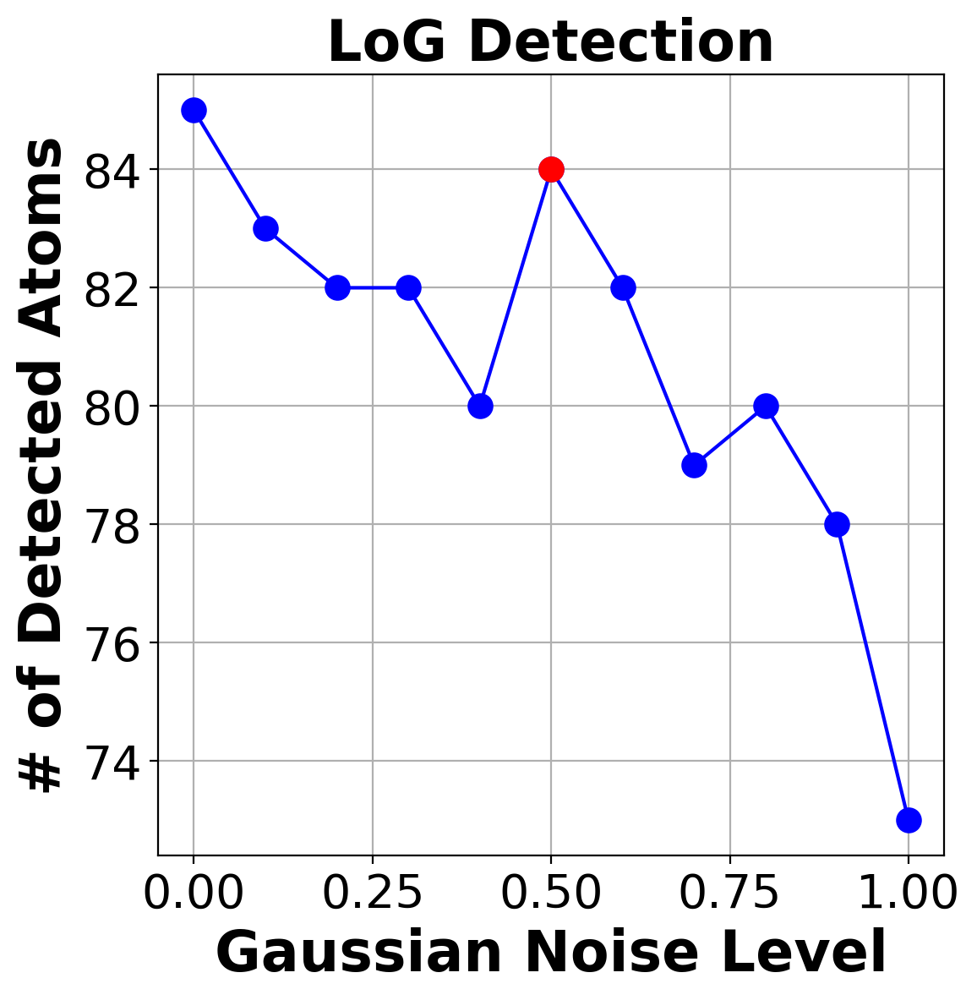

In [ ]:
# Create a scatter plot
plt.figure(figsize=(6, 6), dpi = 200)
plt.plot(normalized_gauss_noise_levels, log_counts, marker='o', linestyle='-', color='blue', markersize=10)
plt.scatter(normalized_gauss_noise_levels[5], log_counts[5], color='red', s=100, label='Index 5', zorder=5)
plt.title('LoG Detection', fontsize = 24 , fontweight ="bold")
plt.xlabel('Gaussian Noise Level', fontsize = 24 , fontweight ="bold")
plt.ylabel('# of Detected Atoms', fontsize = 24 , fontweight ="bold")
plt.tick_params(axis='both', which='major', labelsize=20)
plt.grid(True)
plt.show()

Presentation of the LoG performance vs Noise On the image substrate

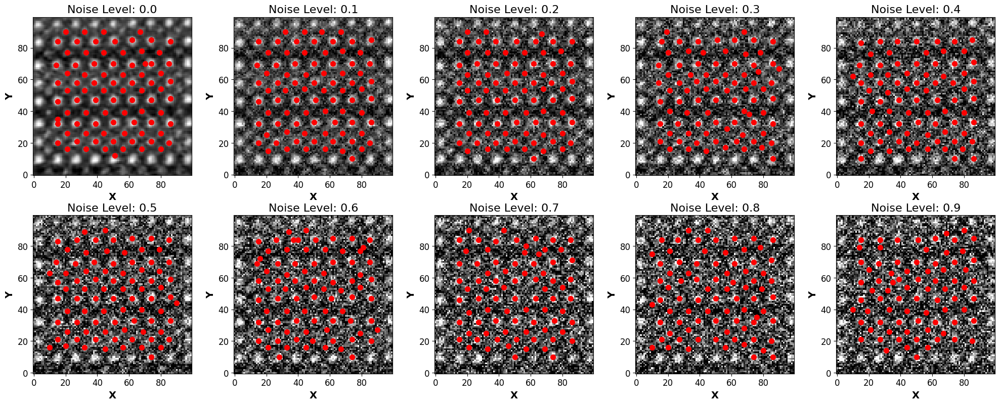

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # 2 rows, 5 columns of plots

for i, ax in enumerate(axes.flatten()):
    if i < len(best_coms):
        x = best_coms[i][:, 1]  # All rows, first column
        y = best_coms[i][:, 0]  # All rows, second column

        # Display the image
        ax.imshow(img_noise_list[i][0, 0, 1000:1100, 1000:1100], cmap='gist_gray')

        # Scatter plot of coordinates on the image
        ax.scatter(x, y, marker='o', c="r", s=50)

        # Setting axis labels with a larger font size
        ax.set_xlabel('X', fontsize=14, fontweight='bold')
        ax.set_ylabel('Y', fontsize=14, fontweight='bold')

        # Changing the tick size
        ax.tick_params(axis='both', labelsize=12)

        # Inverting y-axis to match image coordinates
        ax.invert_yaxis()

        # Setting title to indicate the noise level
        ax.set_title(f'Noise Level: {normalized_gauss_noise_levels[i]}', fontsize=16)
    else:
        ax.axis('off')  # Hide unused subplots

plt.tight_layout()
plt.show()

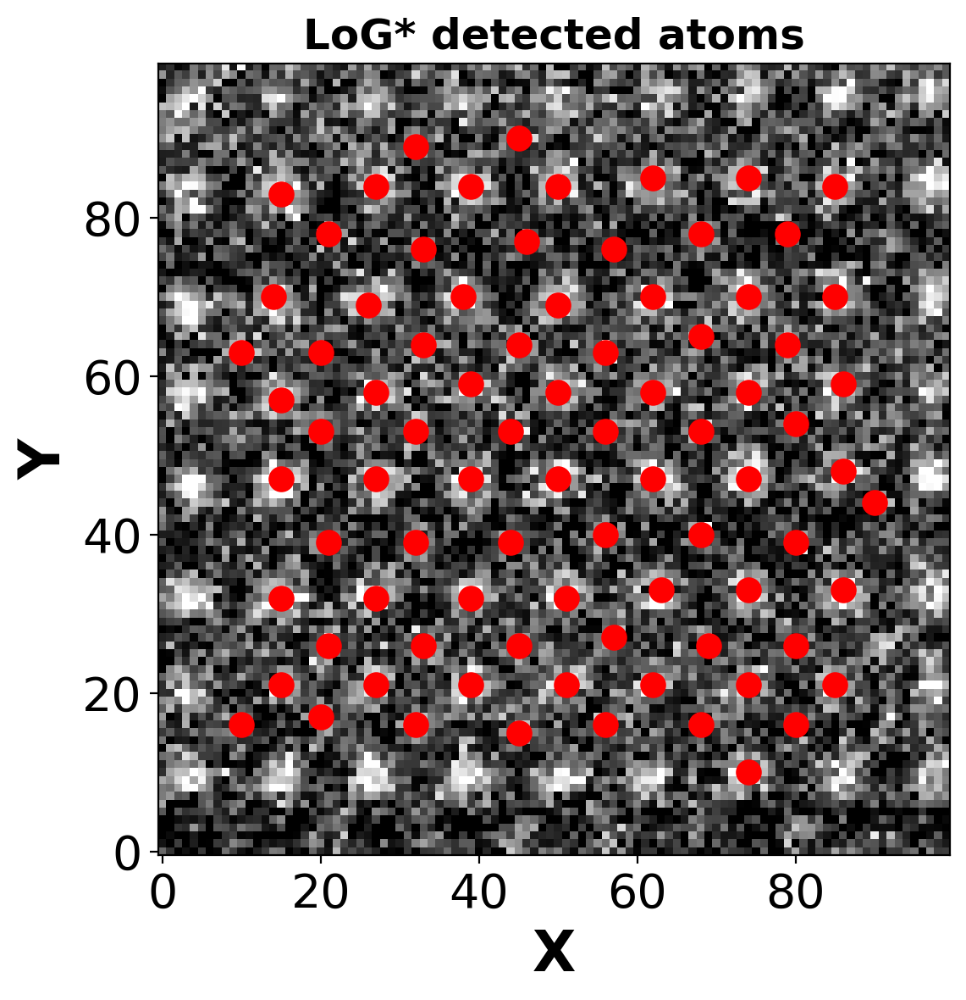

In [ ]:

i = 5  # Index for the sixth plot
fig, ax = plt.subplots(figsize=(6, 6), dpi = 200)  # Create a new figure with a single subplot

# Extract x and y coordinates for scatter plot
x = best_coms[i][:, 1]  # All rows, first column
y = best_coms[i][:, 0]  # All rows, second column

# Display the image slice
ax.imshow(img_noise_list[i][0, 0, 1000:1100, 1000:1100], cmap='gist_gray')

# Scatter plot of coordinates on the image
ax.scatter(x, y, marker='o', c="r", s=100)

# Setting axis labels with a larger font size
ax.set_xlabel('X', fontsize=24, fontweight='bold')
ax.set_ylabel('Y', fontsize=24, fontweight='bold')

# Adjusting the tick size
ax.tick_params(axis='both', labelsize=20)

# Inverting y-axis to match image coordinates
ax.invert_yaxis()

# Setting the plot title to indicate the noise level
ax.set_title('LoG* detected atoms', fontsize=18, fontweight='bold')

plt.tight_layout()
plt.show()

Optimal parameters for LoG change with the noise level presentation

* Each color shows the parameters and objective counterparts
* Numbers on the points shows the level of noise

In [ ]:
min_max_sigma = [row[2:4] for row in best_parameters]

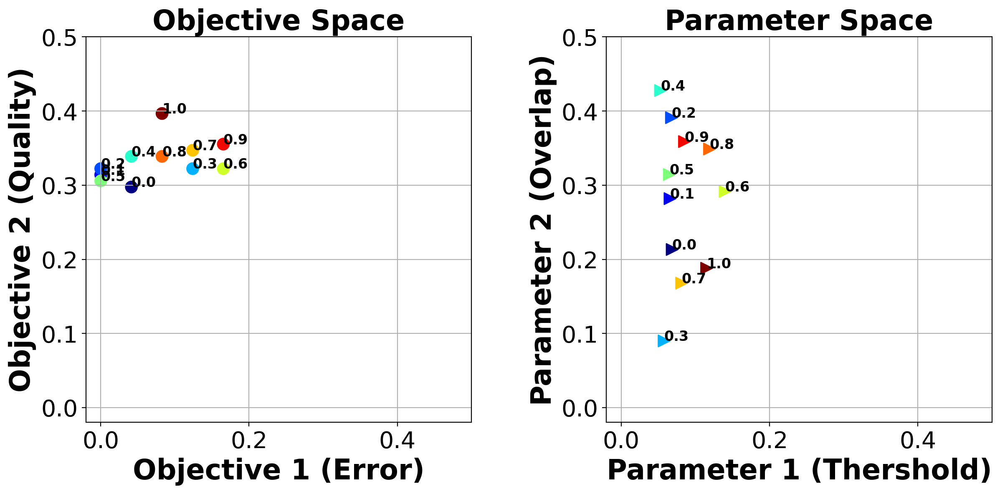

In [ ]:
x_values, y_values = zip(*best_objectives)
x_values_2, y_values_2 = zip(*min_max_sigma)

# Setup the colormap
cmap = plt.get_cmap('jet')
colors = cmap(normalized_gauss_noise_levels)

# Create two subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 6), dpi = 200)
fig.subplots_adjust(wspace=0.35)
# Plot on first subplot with annotations for noise levels
scatter1 = axs[0].scatter(x_values, y_values, c=colors, marker='o', s=100)
axs[0].set_title('Objective Space', fontsize = 24, fontweight = "bold")
axs[0].set_xlabel('Objective 1 (Error)', fontsize = 24, fontweight = "bold")
axs[0].set_ylabel('Objective 2 (Quality)', fontsize = 24, fontweight = "bold")
axs[0].grid(True)
axs[0].set_xlim([-0.02, 0.5])
axs[0].set_ylim([-0.02, 0.5])
axs[0].tick_params(axis='both', which='major', labelsize=20)
for i, txt in enumerate(normalized_gauss_noise_levels):
    axs[0].annotate(f"{txt:.1f}", (x_values[i], y_values[i]), fontsize=12, fontweight = "bold")

# Plot on second subplot with annotations for noise levels
scatter2 = axs[1].scatter(x_values_2, y_values_2, c=colors, marker='>', s=100)
axs[1].set_title('Parameter Space', fontsize = 24, fontweight = "bold")
axs[1].set_xlabel('Parameter 1 (Thershold)', fontsize = 24, fontweight = "bold")
axs[1].set_ylabel('Parameter 2 (Overlap)', fontsize = 24, fontweight = "bold")
axs[1].grid(True)
axs[1].set_xlim([-0.02, 0.5])
axs[1].set_ylim([-0.02, 0.5])
axs[1].tick_params(axis='both', which='major', labelsize=20)
for i, txt in enumerate(normalized_gauss_noise_levels):
    axs[1].annotate(f"{txt:.1f}", (x_values_2[i], y_values_2[i]), fontsize=12, fontweight = "bold")

#plt.tight_layout()
plt.show()

# GMM clustering

This apply_loG function takes **four values** as hyperparameter and returns imstack_grid and coordinates of the detected atoms

For these parametes we use:
Best Parameters based on Euclidean Distance provided by Reward-Driven analysis:
*   Threshold = best_parameters_euclidean[0]
*   Overlap = best_parameters_euclidean[1]
*   min_sigma = best_parameters_euclidean[2]
*   max_sigma = best_parameters_euclidean[3]


Chose the image and selected region to analysis

In [ ]:
img = Image.open("/content/YBCO.tif")
img_array = np.array(img)
img_array = norm2d(img_array[0:1000, 0:1000])
processed_img = norm2d(img_array[0:1000, 0:1000])
array_3d = img_array[None, :, :]

In [ ]:
best_parameters_euclidean_A[0], best_parameters_euclidean_A[1], best_parameters_euclidean_A[2], best_parameters_euclidean_A[3]

(1.877939607268308, 5.776085582546764, 0.05706511000595502, 0.4265732929430595)

In [ ]:
def Apply_LoG_2(window_size):

    coordinates = np.zeros((1,3))
    coms = np.zeros((1,3))

    imglist = [0]
    for i in range(len(imglist)):

        img_processed = norm2d(array_3d[imglist[i]])
        # Initialize arrays to store results
        coordinates = np.zeros((1, 3))
        imstack_grid = np.zeros((1, window_size, window_size, 1))

        # Detect atoms using blob_log
        all_atoms = skimage.feature.blob_log(img_array, min_sigma=best_parameters_euclidean_A[0],
                                            max_sigma=best_parameters_euclidean_A[1],
                                            num_sigma=30,
                                            threshold=best_parameters_euclidean_A[2],
                                            overlap=best_parameters_euclidean_A[3])
        coordinate = np.full_like(all_atoms, i)
        coordinate[:, :-1] = all_atoms[:, :-1]

        imstack, com, frames = aoi.utils.extract_subimages(img_processed, coordinate[:, :-1], window_size)
        com_ = np.full((len(com), 3), i)
        com_[:, :-1] = com

        coms = np.concatenate((coms, com_), axis=0)
        coordinates = np.concatenate((coordinates, coordinate), axis=0)
        imstack_grid = np.concatenate((imstack_grid, imstack), axis=0)

        # Remove the initial placeholder row
        coordinates = coordinates[1:]
        coms = coms[1:]
        imstack_grid = imstack_grid[1:]

    return imstack_grid, coms

In [ ]:
imstack_grid, coms = Apply_LoG_2(window_size = 20)

Intital GMM clustering for on all patches

In [ ]:
def Fit_GMM(imstack_grid, covariance_type, components):

    # Fit a GMM to the reduced data
    flattened_imstack_grid = imstack_grid.reshape(imstack_grid.shape[0], -1)
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(flattened_imstack_grid)

    gmm = GaussianMixture(components, covariance_type=covariance_type, random_state=42)
    gmm.fit(reduced_data)
    colors = gmm.predict(reduced_data)
    centroids = gmm.means_

    return colors, reduced_data, centroids

In [ ]:
colors, reduced_data, centroids = Fit_GMM(imstack_grid, "full" , components = 4)

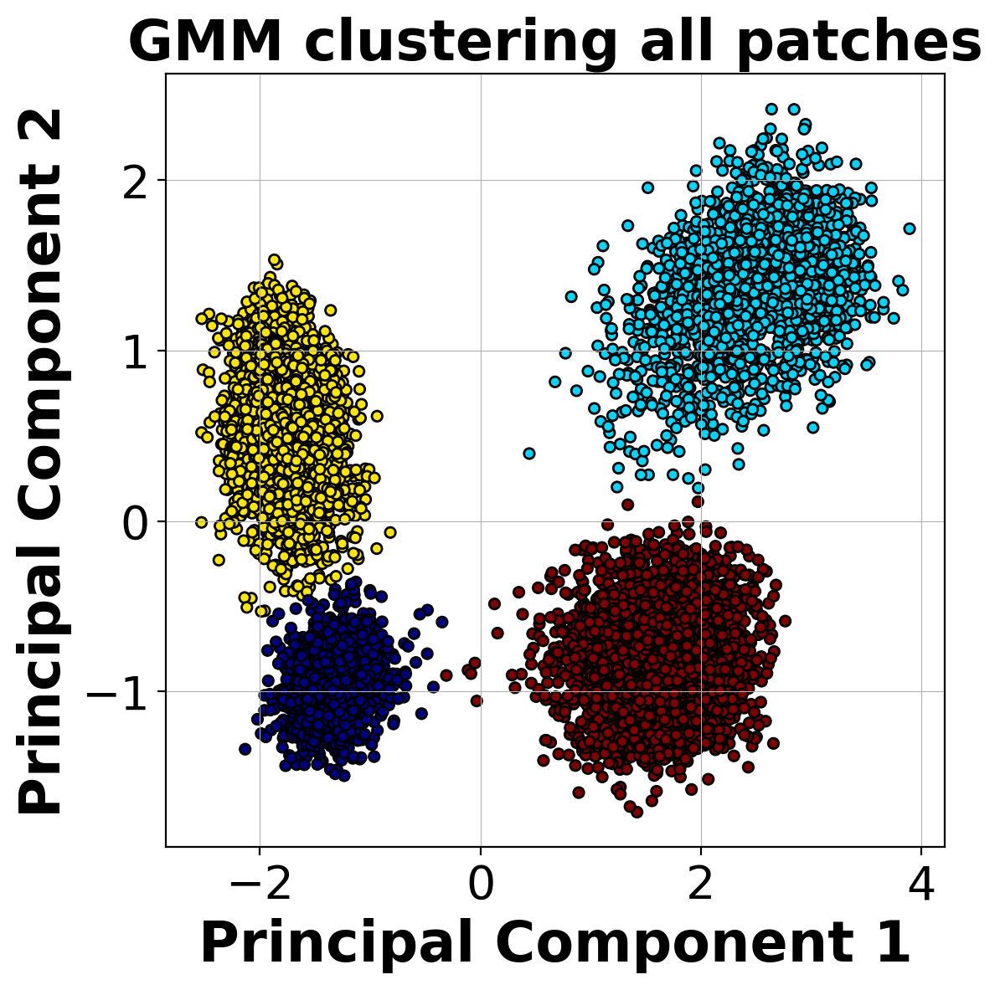

In [ ]:
plt.figure(figsize=(6, 6), dpi = 200)
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=colors, s=20, cmap='jet', edgecolor='k')
plt.title('GMM clustering all patches' , fontsize = 24, fontweight = "bold")
plt.xlabel('Principal Component 1' , fontsize = 24, fontweight = "bold")
plt.ylabel('Principal Component 2' , fontsize = 24, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=20)
plt.grid(True, linewidth=0.4)
plt.show()

Four Clusters are corresponding to:

* **CuO2** (Planes)
* **CuO** (Chains)
* **Ba** (Barium)
* **Y** (Yttrium)

Scatttering overlay on the original image substrate

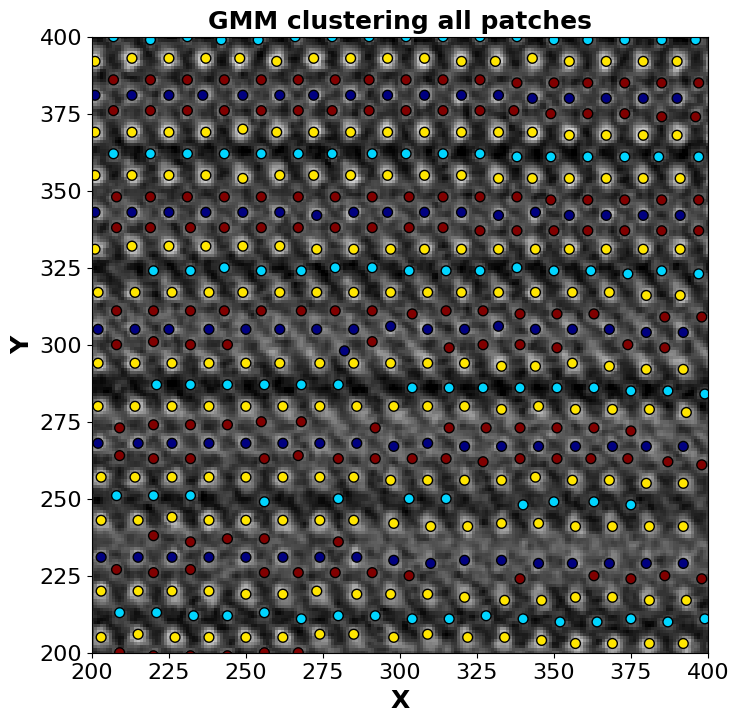

In [ ]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(img, cmap='gist_gray')

# Scatter plot with filtered data
imglab = ax.scatter(coms[:, 1], coms[:, 0], c=colors, s=50, cmap='jet', edgecolor='k')
plt.title('GMM clustering all patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('X' , fontsize = 18, fontweight = "bold")
plt.ylabel('Y' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
x_min , x_max = 200, 400
y_min , y_max = 200, 400

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Scatter plot with filtered data
plt.show()

Intital GMM clustering on patches centered on a specific atom

In [ ]:
# Second Stage
# here chose which atoms we want to concentrate on
# we also can change the windows size and control the surroundings of selected atoms
window_size = 20
desired_label = 2
mask = colors == desired_label
filtered_coms = coms[mask]
filtered_labels = colors[mask]

# here patches on selected atoms would be created
imstack_filtered, com_filtered, frames_filtered = aoi.utils.extract_subimages(processed_img, filtered_coms[:, :-1], window_size)

Call the GMM function based on selected imstack (imstack_filtered), notice the number of components

In [ ]:
colors, reduced_data, centroids = Fit_GMM(imstack_filtered, "full" , components = 1)

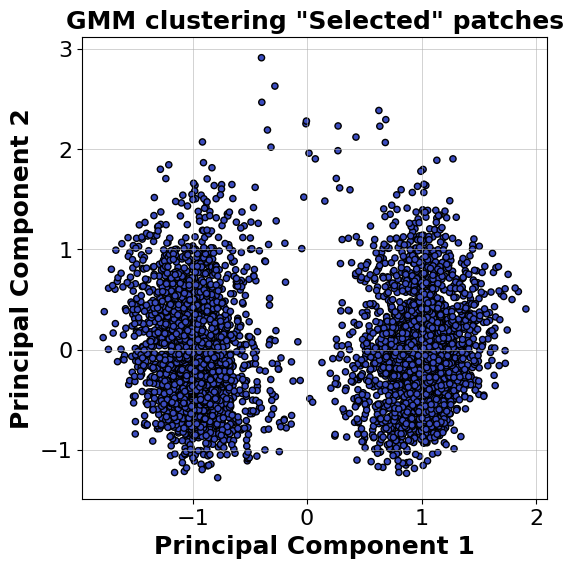

In [ ]:
plt.figure(figsize=(6, 6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=colors, s=20, cmap='coolwarm', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('Principal Component 1' , fontsize = 18, fontweight = "bold")
plt.ylabel('Principal Component 2' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True, linewidth=0.4)
plt.show()

Scatttering overlay on the original image substrate

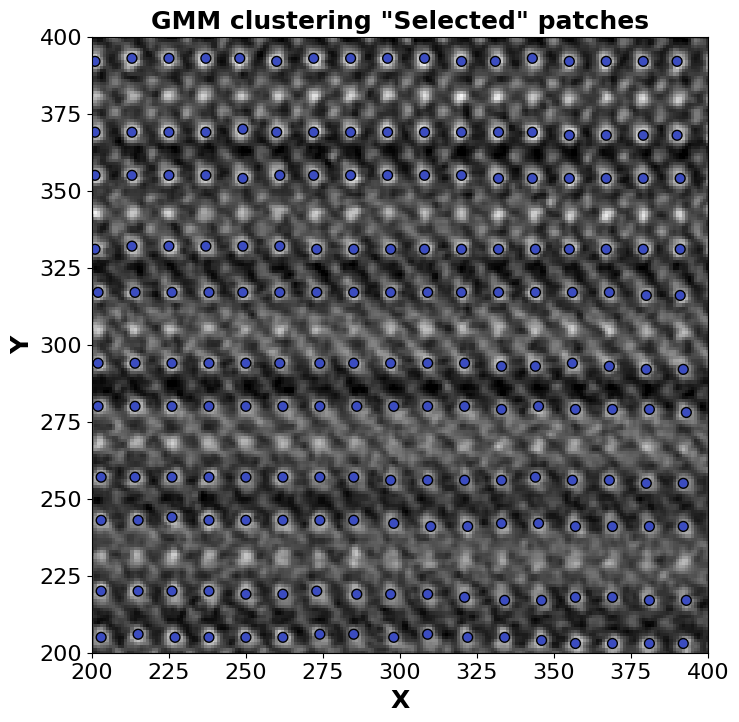

In [ ]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(img, cmap='gist_gray')

# Scatter plot with filtered data
imglab = ax.scatter(filtered_coms[:, 1], filtered_coms[:, 0], c=colors, s=50, cmap='coolwarm', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('X' , fontsize = 18, fontweight = "bold")
plt.ylabel('Y' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
x_min , x_max = 200, 400
y_min , y_max = 200, 400

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Scatter plot with filtered data
plt.show()

# GMM clustering Reward driven

This performs a three-stage image processing pipeline that includes:
* Dimensionality reduction with PCA,
* Clustering with Gaussian Mixture Models,
* Filtering of image data to extract specific regions of interest based on predefined labels.

By chosing the mask for each atoms, all the required data like

* **Patches** centered on that selected atom
* **Coordinates**

would be provided for further analysis

In [ ]:
def Data_preparation(imstack_grid, coms, window_size, desired_label_1, desired_label_2):

    # First Stage
    flattened_imstack_grid = imstack_grid.reshape(imstack_grid.shape[0], -1)
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(flattened_imstack_grid)
    gmm = GaussianMixture(n_components=4, random_state=42)
    gmm.fit(reduced_data)
    labels = gmm.predict(reduced_data)

    # Second Stage
    mask = labels == desired_label_1
    filtered_coms = coms[mask]
    filtered_colors = labels[mask]
    imstack_2, com_2, frames_2 = aoi.utils.extract_subimages(processed_img, filtered_coms[:, :-1], window_size)

    flattened_imstack_grid_2 = imstack_2.reshape(imstack_2.shape[0], -1)
    reduced_data_2 = pca.fit_transform(flattened_imstack_grid_2)
    gmm_2 = GaussianMixture(n_components=2, random_state=42)
    gmm_2.fit(reduced_data_2)
    labels_2 = gmm_2.predict(reduced_data_2)

    # Third Stage
    mask_2 = labels_2 == desired_label_2
    filtered_coms_2 = filtered_coms[mask_2]
    filtered_colors_2 = labels_2[mask_2]
    imstack_final, com_final, frames_final = aoi.utils.extract_subimages(processed_img, filtered_coms_2[:, :-1], window_size)

    return imstack_final, com_final, frames_final , imstack_2, reduced_data, com_2, filtered_colors, filtered_colors_2

Notice the lable for each types of atoms here:
* The label might change each run so notice to pick the selected label you want to analyse

In [ ]:
#CuO2 (Planes)
#Ba (Barium)
# CuO (Chains)
#Y (Yttrium)

desired_label_1 = 2
desired_label_2 = 1
window_size = 20
imstack_grid, coms = Apply_LoG_2(window_size)

In [ ]:
imstack_final, com_final, frames_final, imstack_2, reduced_data, com_2, filtered_colors, filtered_colors_2 = Data_preparation(imstack_grid, coms, window_size, desired_label_1, desired_label_2)

Vistualization of how GMM with threshold, covariance_type changes the final clusters

* Notice changing the imstack_final if you want to show the variations with chaning covariance_type

In [ ]:
#colors, reduced_data = Fit_GMM(imstack_2, "full" , components = 2)

In [ ]:
"""plt.figure(figsize=(6, 6), dpi = 200)
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=colors, s=20, cmap='coolwarm', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('Principal Component 1' , fontsize = 18, fontweight = "bold")
plt.ylabel('Principal Component 2' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True, linewidth=0.4)
plt.show()"""


'plt.figure(figsize=(6, 6), dpi = 200)\nplt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=colors, s=20, cmap=\'coolwarm\', edgecolor=\'k\')\nplt.title(\'GMM clustering "Selected" patches\' , fontsize = 18, fontweight = "bold")\nplt.xlabel(\'Principal Component 1\' , fontsize = 18, fontweight = "bold")\nplt.ylabel(\'Principal Component 2\' , fontsize = 18, fontweight = "bold")\nplt.tick_params(axis=\'both\', which=\'major\', labelsize=16)\nplt.grid(True, linewidth=0.4)\nplt.show()'

In [ ]:
def Fit_GMM_m(ax, threshold, covariance_type, color):
    global imstack_final  # Assuming imstack_final is predefined
    # Flatten the image stack for PCA
    flattened_imstack_grid = imstack_final.reshape(imstack_final.shape[0], -1)

    # PCA Reduction to 2 components
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(flattened_imstack_grid)

    # Fit Gaussian Mixture Model on the reduced data
    gmm = GaussianMixture(n_components=2, covariance_type=covariance_type, random_state=42)
    gmm.fit(reduced_data)
    probabilities = gmm.predict_proba(reduced_data)

    # Determine centroids and identify the 'amorphous' cluster
    centroids = gmm.means_
    amorphous_cluster_index = np.argmax(centroids[:, 0])

    # Create a grid of points to plot the decision boundaries
    x = np.linspace(reduced_data[:, 0].min(), reduced_data[:, 0].max(), 100)
    y = np.linspace(reduced_data[:, 1].min(), reduced_data[:, 1].max(), 100)
    X, Y = np.meshgrid(x, y)
    XX = np.column_stack([X.ravel(), Y.ravel()])
    Z = gmm.predict_proba(XX)[:, amorphous_cluster_index].reshape(X.shape)

    # Plot decision boundaries and filled contours on the provided axis
    ax.scatter(reduced_data[:, 0], reduced_data[:, 1], c=probabilities[:, amorphous_cluster_index], s = 20,  cmap='coolwarm', edgecolor='k')
    ax.contour(X, Y, Z, levels=[threshold], colors=color, linestyles='dashed' , linewidths=3)
    ax.contourf(X, Y, Z, levels=[threshold, 1], alpha=0.07, colors=[color])
    ax.set_title('GMM with Covariance and Threshold', fontsize = 24, fontweight = "bold")
    ax.set_xlabel('Principal Component 1' , fontsize = 24, fontweight = "bold")
    ax.set_ylabel('Principal Component 2' , fontsize = 24, fontweight = "bold")
    plt.tick_params(axis='both', which='major', labelsize=20)
    ax.grid(True, linewidth=0.4)

    # Add label for legend handling
    return Patch(facecolor=color, edgecolor='k', label=f'{covariance_type} (Thresh: {threshold})')

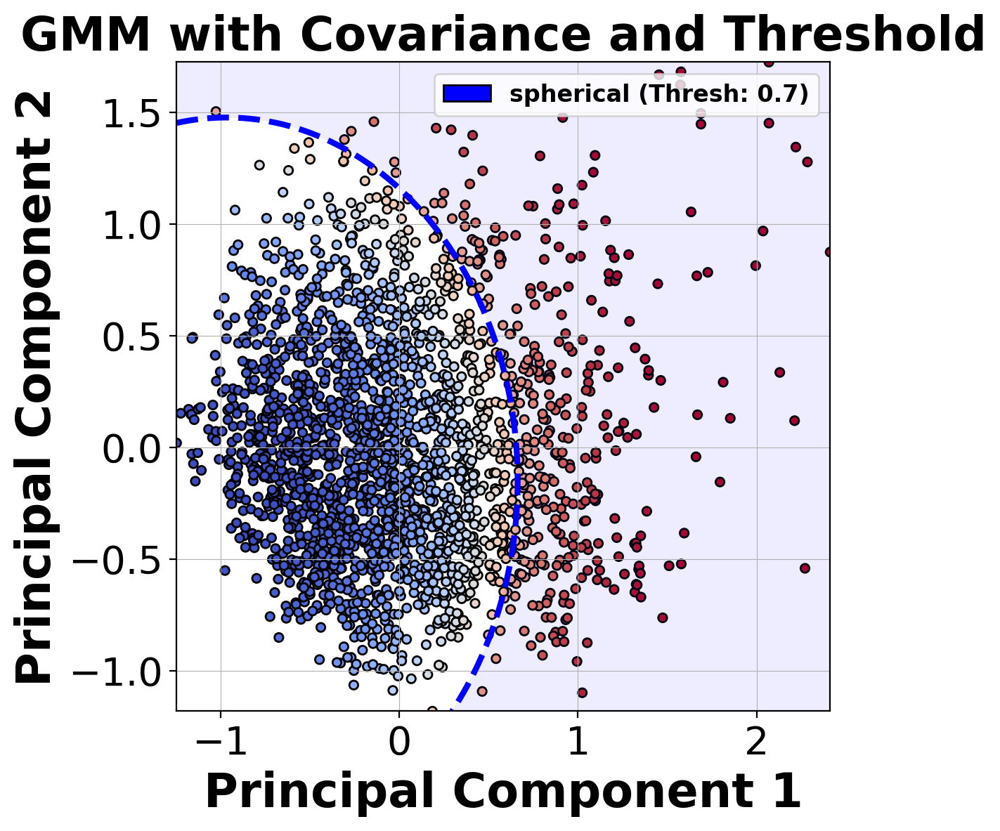

In [ ]:
# Example plotting script
fig, ax = plt.subplots(figsize=(6, 6), dpi = 200)
#covariance_types = ['tied', 'full', 'diag', 'spherical']
covariance_types = ['spherical']
#thresholds = [0.7, 0.4, 0.6, 0.3]
thresholds = [0.7]
#colors = ['red', 'green', 'blue', 'purple']
colors = [ 'blue']

legend_handles = []
for cov_type, thres, color in zip(covariance_types, thresholds, colors):
    patch = Fit_GMM_m(ax, thres, cov_type, color)
    legend_handles.append(patch)

plt.legend(handles=legend_handles, loc='upper right', bbox_to_anchor=(1, 1), prop={'size': 'large', 'weight': 'bold'})
plt.show()

Scattering overlay of selected atoms on teh image substrate
* Notice changing coms and colors with regard to the selected atoms

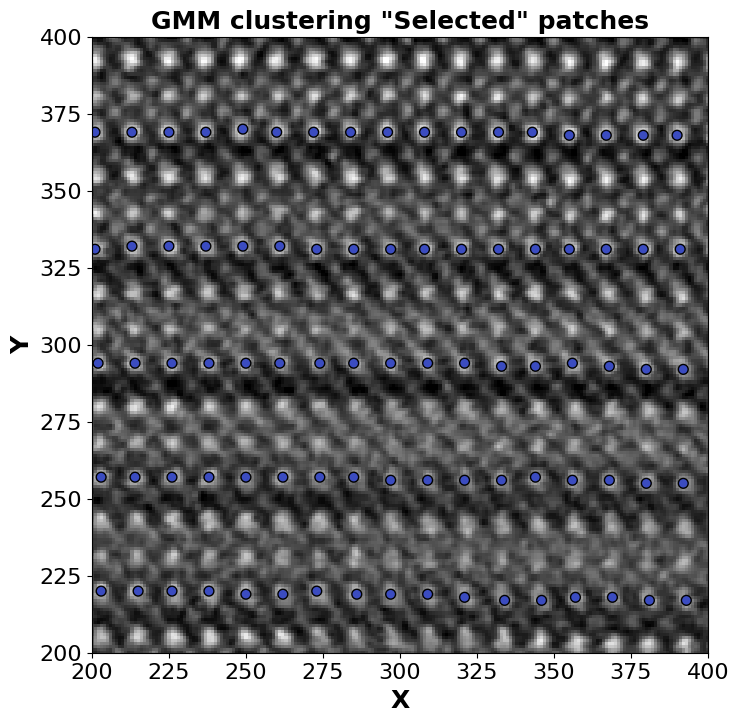

In [ ]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(img, cmap='gist_gray')

# Scatter plot with filtered data
imglab = ax.scatter(com_final[:, 1], com_final[:, 0], c=filtered_colors_2, s=50, cmap='coolwarm', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('X' , fontsize = 18, fontweight = "bold")
plt.ylabel('Y' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
x_min , x_max = 200, 400
y_min , y_max = 200, 400

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Scatter plot with filtered data
plt.show()

Define specified version of GMM fucntion for the workflow: variables are

* Threshold
* Covariance_type

Chose the image and selected region to analysis

In [ ]:
img = Image.open("/content/YBCO.tif")
img_array = np.array(img)
img_array = norm2d(img_array[0:1000, 0:1000])
processed_img = norm2d(img_array[0:1000, 0:1000])
array_3d = img_array[None, :, :]

In [ ]:
imstack_grid, coms = Apply_LoG_2(window_size = 20)
imstack_final, com_final, frames_final, imstack_2, reduced_data, com_2, filtered_colors, filtered_colors_2 = Data_preparation(imstack_grid, coms, window_size, desired_label_1, desired_label_2)

In [ ]:
def Fit_GMM(threshold, covariance_type):

    imstack_grid = imstack_final
    # Fit a GMM to the reduced data
    flattened_imstack_grid = imstack_grid.reshape(imstack_grid.shape[0], -1)
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(flattened_imstack_grid)

    gmm = GaussianMixture(n_components=2, covariance_type=covariance_type, random_state=42)
    gmm.fit(reduced_data)
    probabilities = gmm.predict_proba(reduced_data)

    # Identify the 'amorphous' cluster
    centroids = gmm.means_
    amorphous_cluster_index = np.argmax(centroids[:, 0])

    # Determine membership based on the threshold
    amorphous_membership_mask = probabilities[:, amorphous_cluster_index] > threshold

    # Assign colors based on membership
    colors = np.where(amorphous_membership_mask, 'red', 'blue')

    return colors, reduced_data

The function **create_binary_masks_and_label**

* Generates binary masks for crystalline and amorphous regions based on **color labels**,
* Applies dilation to these masks,
* Computes the area and perimeter of these regions,
* And returns normalized values of amorphous area and perimeter.

In [ ]:
def create_binary_masks_and_label(colors, window_size):

    #com_grid, imstack_grid , coms = Apply_LoG(window_size)
    com_grid = com_final
    image_shape = img_array.shape
    window_size = int(window_size)
    crystalline_mask = np.zeros(image_shape, dtype=bool)

    for (y, x), color in zip(com_grid, colors):
        y, x = int(y), int(x)
        if 0 <= y < image_shape[0] and 0 <= x < image_shape[1]:
            if color == 'blue':  # 'blue' for crystalline
                crystalline_mask[y:y+window_size, x:x+window_size] = True

    amorphous_mask = ~crystalline_mask  # Everything not crystalline is amorphous

    disk_radius = 5
    selem = disk(disk_radius)
    dilated_crystalline_mask = dilation(crystalline_mask, selem) #amorphous_mask
    dilated_amorphous_mask = dilation(amorphous_mask, selem)


    # Calculate the actual areas
    crystalline_area = np.sum(dilated_crystalline_mask)  # Sum of True values in the dilated crystalline mask
    amorphous_area = np.sum(dilated_amorphous_mask)  # Sum of True values in the dilated amorphous mask

    # Label the image and calculate the perimeter for the amorphous regions
    label_img = label(dilated_amorphous_mask)
    perimeter_list = [region.perimeter for region in regionprops(label_img)]
    total_amorphous_perimeter = np.sum(perimeter_list)

    # Normalize the perimeter and areas
    max_perimeter = 2 * (image_shape[0] + image_shape[1])
    normalized_amorphous_perimeter = total_amorphous_perimeter  / max_perimeter

    total_area = crystalline_area + amorphous_area
    normalized_crystalline_area = (crystalline_area / total_area) * 100
    normalized_amorphous_area = (amorphous_area / total_area) * 100

    return normalized_amorphous_area, normalized_amorphous_perimeter #, dilated_amorphous_mask , dilated_crystalline_mask

In [ ]:
# normalized_amorphous_area, normalized_amorphous_perimeter  = create_binary_masks_and_label(colors, window_size)

Here a simple representaion of how the dialetaion mask changes verses changing:
* Colors
* Window_size
* Disk_radius

or more importantly **Atoms type**

In [ ]:
"""# Plot the dilated amorphous and crystalline masks
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Dilated amorphous mask
ax[0].imshow(dilated_amorphous_mask, cmap='gray')
ax[0].set_title('Dilated Amorphous Mask')
ax[0].axis('off')

# Dilated crystalline mask
ax[1].imshow(dilated_crystalline_mask, cmap='gray')
ax[1].set_title('Dilated Crystalline Mask')
ax[1].axis('off')

plt.tight_layout()
plt.show()"""

"# Plot the dilated amorphous and crystalline masks\nfig, ax = plt.subplots(1, 2, figsize=(12, 6))\n\n# Dilated amorphous mask\nax[0].imshow(dilated_amorphous_mask, cmap='gray')\nax[0].set_title('Dilated Amorphous Mask')\nax[0].axis('off')\n\n# Dilated crystalline mask\nax[1].imshow(dilated_crystalline_mask, cmap='gray')\nax[1].set_title('Dilated Crystalline Mask')\nax[1].axis('off')\n\nplt.tight_layout()\nplt.show()"

The function analyze_image integrates several image analysis steps:
* it fits a Gaussian Mixture Model (GMM) to classify features based on color and other parameters,
* generates binary masks for amorphous and crystalline regions using these classifications,
* and finally calculates and returns the normalized area and perimeter of the amorphous regions.

In [ ]:
def analyze_image(window_size, threshold, covariance_type):

    # Fit a GMM to classify the detected features
    colors, reduced_data = Fit_GMM(threshold, covariance_type)

    #com_grid, imstack_grid , coms = Apply_LoG(window_size)
    # Create binary masks and calculate normalized amorphous area and perimeter
    normalized_amorphous_area, normalized_amorphous_perimeter = create_binary_masks_and_label(colors, window_size)

    return normalized_amorphous_area, normalized_amorphous_perimeter

## Objectives

* Perimeter
* compactness

In [ ]:
def calculate_compactness(normalized_amorphous_perimeter, normalized_amorphous_area):

    perimeter = normalized_amorphous_perimeter
    area = normalized_amorphous_area

    comp = area / (perimeter ** 2)

    return comp, perimeter

## Multi-Objective Optimization

The provided funcrions define and execute a multi-objective optimization problem using the **NSGA-II** algorithm. The main goal of this optimization is to minimize two objectives

* Compactness
* Perimeter

By adjusting certain hyper-parameters:

* Threshold
* Covariance type
* Windows_size

In [ ]:
class ImageOptimizationProblem(Problem):
    def __init__(self):
        super(ImageOptimizationProblem, self).__init__(3, 2)  # Changed from (1, 2) to (3, 2)
        # Define ranges for window_size, threshold, and a continuous representation of covariance_type
        self.types[:] = [Real(3, 128), Real(0.0, 1.0), Real(0, 3)]
        self.directions[:] = [Problem.MINIMIZE, Problem.MINIMIZE]

    def evaluate(self, solution):
        window_size = int(solution.variables[0])
        threshold = solution.variables[1]

        # Map continuous covariance variable to categorical
        covariance_index = int(solution.variables[2])
        covariance_types = ['full', 'tied', 'diag', 'spherical']
        covariance_type = covariance_types[covariance_index % len(covariance_types)]

        # Call the analyze_image function with the new variables
        normalized_amorphous_area, normalized_amorphous_perimeter = analyze_image(window_size, threshold, covariance_type)
        comp, perimeter = calculate_compactness(normalized_amorphous_perimeter, normalized_amorphous_area)


        # Ensure the objectives are returned as a list or array of two values
        solution.objectives[:] = [comp, normalized_amorphous_perimeter]

In [ ]:
covariance_types = ['full', 'tied', 'diag', 'spherical']

problem = ImageOptimizationProblem()
algorithm = NSGAII(problem)
algorithm.run(10)  # Adjust the number of iterations as needed


for solution in algorithm.result:
    window_size = int(solution.variables[0])
    threshold = solution.variables[1]

    # Map the continuous variable for covariance_type back to the categorical value
    covariance_index = int(solution.variables[2])
    covariance_type = covariance_types[covariance_index % len(covariance_types)]

    # Print the best variables along with the objectives
    print(f"Window Size: {window_size}, Threshold: {threshold:.2f}, Covariance Type: {covariance_type}, "
          f"Compactness: {solution.objectives[0]:.2f}, Normalized Perimeter: {solution.objectives[1]:.2f}")

Window Size: 127, Threshold: 0.99, Covariance Type: full, Compactness: 4.65, Normalized Perimeter: 1.01
Window Size: 58, Threshold: 0.51, Covariance Type: diag, Compactness: 2.87, Normalized Perimeter: 2.81
Window Size: 80, Threshold: 0.30, Covariance Type: full, Compactness: 3.06, Normalized Perimeter: 2.59
Window Size: 52, Threshold: 0.63, Covariance Type: full, Compactness: 3.05, Normalized Perimeter: 2.61
Window Size: 83, Threshold: 0.42, Covariance Type: full, Compactness: 3.13, Normalized Perimeter: 2.30
Window Size: 25, Threshold: 0.67, Covariance Type: full, Compactness: 0.39, Normalized Perimeter: 11.26
Window Size: 112, Threshold: 0.85, Covariance Type: tied, Compactness: 4.01, Normalized Perimeter: 1.12
Window Size: 24, Threshold: 0.30, Covariance Type: tied, Compactness: 0.46, Normalized Perimeter: 10.63
Window Size: 99, Threshold: 0.50, Covariance Type: full, Compactness: 2.80, Normalized Perimeter: 1.99
Window Size: 121, Threshold: 0.36, Covariance Type: diag, Compactness

Pareto Front Solutions Highlighted

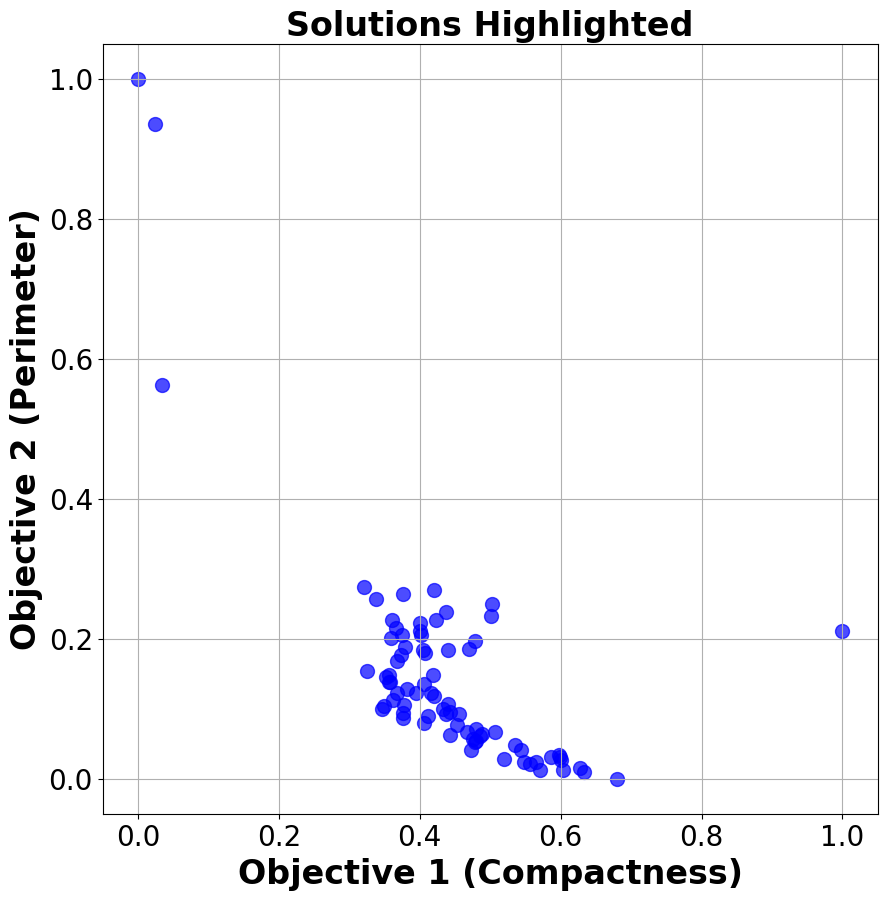

In [ ]:
solutions = algorithm.result
objectives = [s.objectives[:] for s in solutions]

# Separate objectives for plotting
obj1 = [o[0] for o in objectives]  # First objective
obj2 = [o[1] for o in objectives]  # Second objective

filtered_objectives = [s.objectives[:] for s in solutions if all(0 <= o <= 10 for o in s.objectives)]

# Separate filtered objectives for plotting
obj1_filtered = [o[0] for o in filtered_objectives]  # First objective, filtered
obj2_filtered = [o[1] for o in filtered_objectives]

obj1_normalized = [(o - min(obj1_filtered)) / (max(obj1_filtered) - min(obj1_filtered)) for o in obj1_filtered]
obj2_normalized = [(o - min(obj2_filtered)) / (max(obj2_filtered) - min(obj2_filtered)) for o in obj2_filtered]

plt.figure(figsize=(10, 10))

# Create scatter plot
plt.scatter(obj1_normalized, obj2_normalized, s=100, marker='o', c="blue", alpha=0.7)

# Adding plot labels and title
plt.title('Solutions Highlighted', fontsize = 24, fontweight = "bold")
plt.xlabel('Objective 1 (Compactness)', fontsize = 24, fontweight = "bold")
plt.ylabel('Objective 2 (Perimeter)', fontsize = 24, fontweight = "bold")
plt.grid(True)
plt.tick_params(axis='both', which='major', labelsize=20)

#plt.xlim([-0.05, 10])  # Replace xmin and xmax with your desired values
#plt.ylim([-0.05, 10])

#plt.gca().set_aspect('equal', adjustable='box')
plt.show()

Define two metrics to select a single solution from the set of Pareto optimal solutions, each incorporating a different perspective on what constitutes the "best" solution based on proximity to an ideal outcome.

* **Euclidean Distance**: Choose the solution with the minimum Euclidean distance to the ideal point.
* **Chebyshev Distance**: Choose the solution that minimizes the maximum deviation from the ideal point across all objectives.

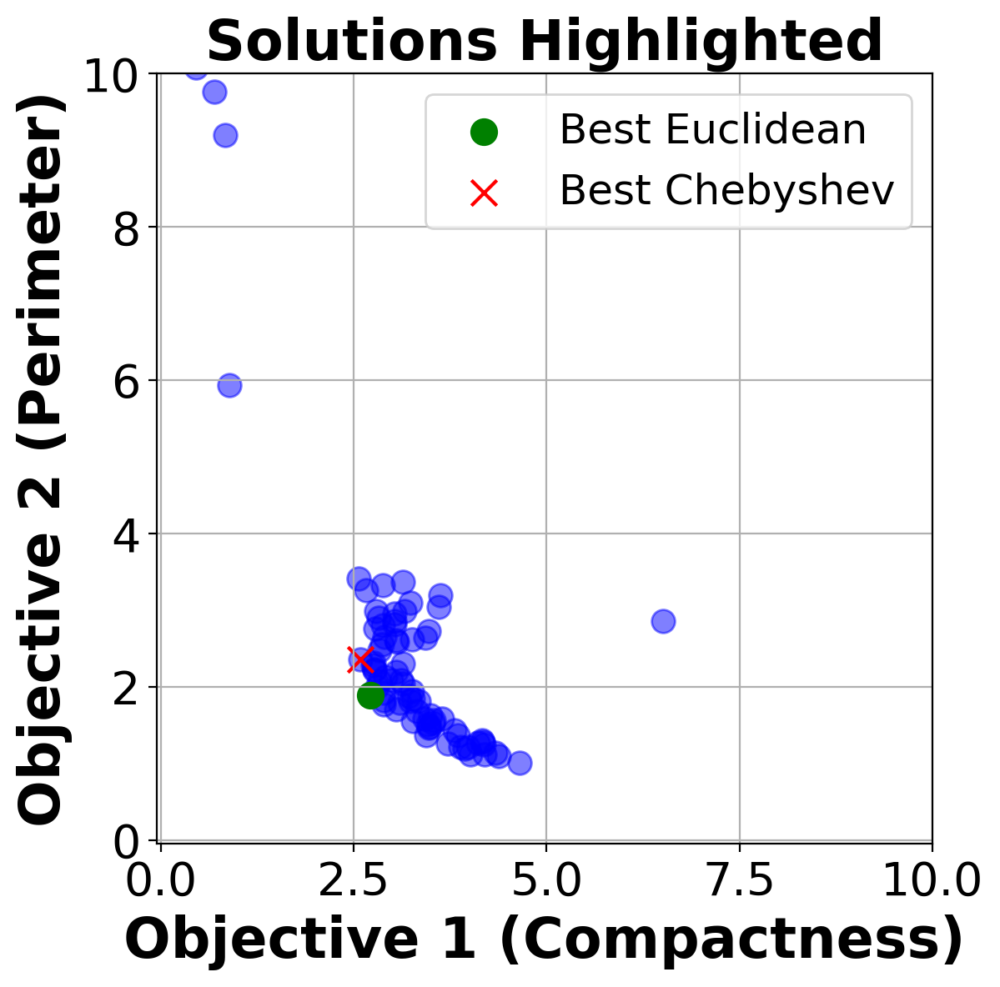

In [ ]:
# Given: solutions and objectives extraction from your algorithm's result
solutions = algorithm.result
objectives = [s.objectives[:] for s in solutions]

filtered_objectives = [s.objectives[:] for s in solutions if all(0 <= o <= 10 for o in s.objectives)]

# Define your ideal point here
ideal_point = [0, 0]  # Replace ideal_obj1 and ideal_obj2 with your ideal values

# Calculate distances
euclidean_distances = [np.sqrt(np.sum((np.array(obj) - np.array(ideal_point)) ** 2)) for obj in objectives]
chebyshev_distances = [np.max(np.abs(np.array(obj) - np.array(ideal_point))) for obj in objectives]

# Find the best solutions based on distances
best_solution_euclidean_index = np.argmin(euclidean_distances)
best_solution_chebyshev_index = np.argmin(chebyshev_distances)

# Separate objectives for plotting
obj1 = [o[0] for o in objectives]
obj2 = [o[1] for o in objectives]

# Separate filtered objectives for plotting
obj1_filtered = [o[0] for o in filtered_objectives]
obj2_filtered = [o[1] for o in filtered_objectives]
# Find the minimum and maximum values for obj1 and obj2
obj1_min, obj1_max = min(obj1_filtered), max(obj1_filtered)
obj2_min, obj2_max = min(obj2_filtered), max(obj2_filtered)

# Apply min-max normalization
obj1_normalized = [(o - obj1_min) / (obj1_max - obj1_min) for o in obj1_filtered]
obj2_normalized = [(o - obj2_min) / (obj2_max - obj2_min) for o in obj2_filtered]

fig = plt.figure(figsize=(6, 6), dpi = 200)

# Create scatter plot of the Pareto front
plt.scatter(obj1, obj2, s=100, marker='o', c="blue", alpha=0.5)
plt.scatter(obj1[best_solution_euclidean_index], obj2[best_solution_euclidean_index], color='green', label='Best Euclidean' , alpha=1, s = 120)
plt.scatter(obj1[best_solution_chebyshev_index], obj2[best_solution_chebyshev_index], color='red', label='Best Chebyshev', alpha=1, marker='x', s = 120)
# Create scatter plot

# Adding plot labels and title
plt.title('Solutions Highlighted', fontsize = 24, fontweight = "bold")
plt.xlabel('Objective 1 (Compactness)', fontsize = 24, fontweight = "bold")
plt.ylabel('Objective 2 (Perimeter)', fontsize = 24, fontweight = "bold")
plt.grid(True)
plt.tick_params(axis='both', which='major', labelsize=20)

plt.xlim([-0.05, 10])  # Replace xmin and xmax with your desired values
plt.ylim([-0.05, 10])
plt.legend(prop={'size': 18})
#plt.gca().set_aspect('equal', adjustable='box')
plt.show()

## TEST

Find the values of optimum solutions

In [ ]:
# Retrieve the best solutions based on Euclidean and Chebyshev distances
best_solution_euclidean_gmm = solutions[best_solution_euclidean_index]
best_solution_chebyshev_gmm = solutions[best_solution_chebyshev_index]

# Extract the parameters from these solutions
best_parameters_euclidean_gmm = best_solution_euclidean_gmm.variables
best_parameters_chebyshev_gmm = best_solution_chebyshev_gmm.variables

# Print the best parameters for each method
print("Best Parameters based on Euclidean Distance:", best_parameters_euclidean_gmm)
print("Best Parameters based on Chebyshev Distance:", best_parameters_chebyshev_gmm)

Best Parameters based on Euclidean Distance: [112.87141639977418, 0.44110320781133083, 2.9385039653710554]
Best Parameters based on Chebyshev Distance: [105.17132335124981, 0.30435148277808155, 2.199421354779134]


In [ ]:
def get_covariance_type(index):
    return covariance_types[index % len(covariance_types)]

# Extract and map the parameters from these solutions
window_size_euclidean = int(best_solution_euclidean_gmm.variables[0])
threshold_euclidean = best_solution_euclidean_gmm.variables[1]
covariance_type_euclidean = get_covariance_type(int(best_solution_euclidean_gmm.variables[2]))

window_size_chebyshev = int(best_solution_chebyshev_gmm.variables[0])
threshold_chebyshev = best_solution_chebyshev_gmm.variables[1]
covariance_type_chebyshev = get_covariance_type(int(best_solution_chebyshev_gmm.variables[2]))

# Print the best parameters for each method
print(f"Best Parameters based on Euclidean Distance: Window Size: {window_size_euclidean}, "
      f"Threshold: {threshold_euclidean:.2f}, Covariance Type: {covariance_type_euclidean}")

print(f"Best Parameters based on Chebyshev Distance: Window Size: {window_size_chebyshev}, "
      f"Threshold: {threshold_chebyshev:.2f}, Covariance Type: {covariance_type_chebyshev}")

Best Parameters based on Euclidean Distance: Window Size: 112, Threshold: 0.44, Covariance Type: diag
Best Parameters based on Chebyshev Distance: Window Size: 105, Threshold: 0.30, Covariance Type: diag


Call the test function using the optimum hyper-paramters

In [ ]:
Window_size = window_size_euclidean
Threshold = threshold_euclidean
Covariance_Type = covariance_type_euclidean

In [ ]:
def Fit_GMM(threshold, covariance_type):

    imstack_grid = imstack_final
    # Fit a GMM to the reduced data
    flattened_imstack_grid = imstack_grid.reshape(imstack_grid.shape[0], -1)
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(flattened_imstack_grid)

    gmm = GaussianMixture(n_components=2, covariance_type=covariance_type, random_state=42)
    gmm.fit(reduced_data)
    probabilities = gmm.predict_proba(reduced_data)

    # Identify the 'amorphous' cluster
    centroids = gmm.means_
    amorphous_cluster_index = np.argmax(centroids[:, 0])

    # Determine membership based on the threshold
    amorphous_membership_mask = probabilities[:, amorphous_cluster_index] > threshold

    # Assign colors based on membership
    colors = np.where(amorphous_membership_mask, 'red', 'blue')

    return colors, reduced_data

In [ ]:
colors, reduced_data = Fit_GMM(threshold_euclidean, covariance_type_euclidean)

Vistualization of how **GMM** with optimum threshold, and covariance_type creates the final clusters

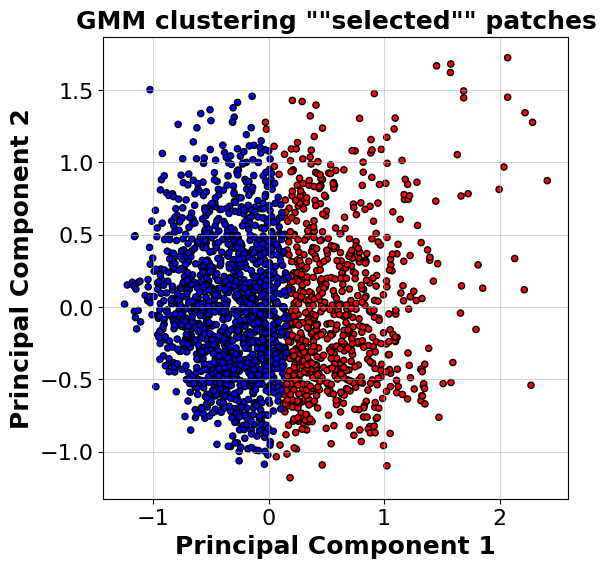

In [ ]:
# Visualization in the PCA reduced space (if PCA is used)
plt.figure(figsize=(6, 6))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=colors, s=20, cmap='jet', edgecolor='k')
plt.title('GMM clustering ""selected"" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('Principal Component 1' , fontsize = 18, fontweight = "bold")
plt.ylabel('Principal Component 2' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
plt.grid(True, linewidth=0.4)
plt.show()

Scattering overlay on original image with uncovered amorohous and crystalline regions

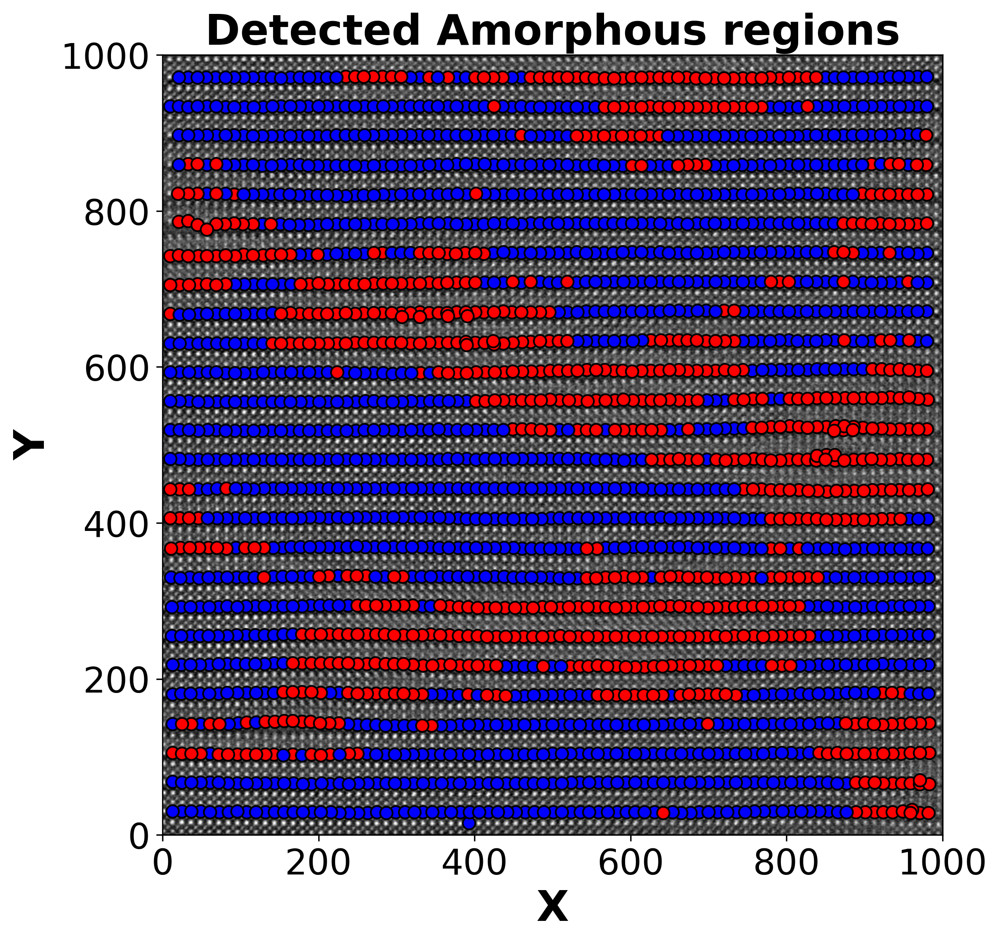

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8), dpi = 300)
ax.imshow(img_array, cmap='gist_gray')

x_min , x_max = 0, 1000
y_min , y_max = 0, 1000

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

ax.set_title('Detected Amorphous regions', fontsize=24, fontweight='bold')
ax.set_xlabel('X', fontsize=24, fontweight='bold')
ax.set_ylabel('Y', fontsize=24, fontweight='bold')
# Changing the tick size
ax.tick_params(axis='both', labelsize=20)
imglab = ax.scatter(com_final[:, 1], com_final[:, 0], c=colors,  s=50, cmap='coolwarm', edgecolor='k')
plt.show()

# Variational AutoEncoder

Centered on all or selected classes

In [ ]:
img = Image.open("/content/YBCO.tif")
img_array = np.array(img)
img_array = norm2d(img_array[0:1000, 0:1000])
processed_img = norm2d(img_array[0:1000, 0:1000])
array_3d = img_array[None, :, :]

In [ ]:
desired_label_1 = 0
desired_label_2 = 1
window_size = 20

Notice if you run the Apply_LoG_2 the classes might change so play with
* desired_label_1
* desired_label_2

to find the class you are intrested in

In [ ]:
# recall the optimum hyper parameters for tunning Apply_LoG_2 function
best_parameters_euclidean_A[0], best_parameters_euclidean_A[1], best_parameters_euclidean_A[2], best_parameters_euclidean_A[3]

(1.877939607268308, 5.776085582546764, 0.05706511000595502, 0.4265732929430595)

In [ ]:
imstack_grid, coms = Apply_LoG_2(window_size)
imstack_final, com_final, frames_final, imstack_2, reduced_data, com_2, filtered_colors, filtered_colors_2 = Data_preparation(imstack_grid, coms, window_size, desired_label_1, desired_label_2)

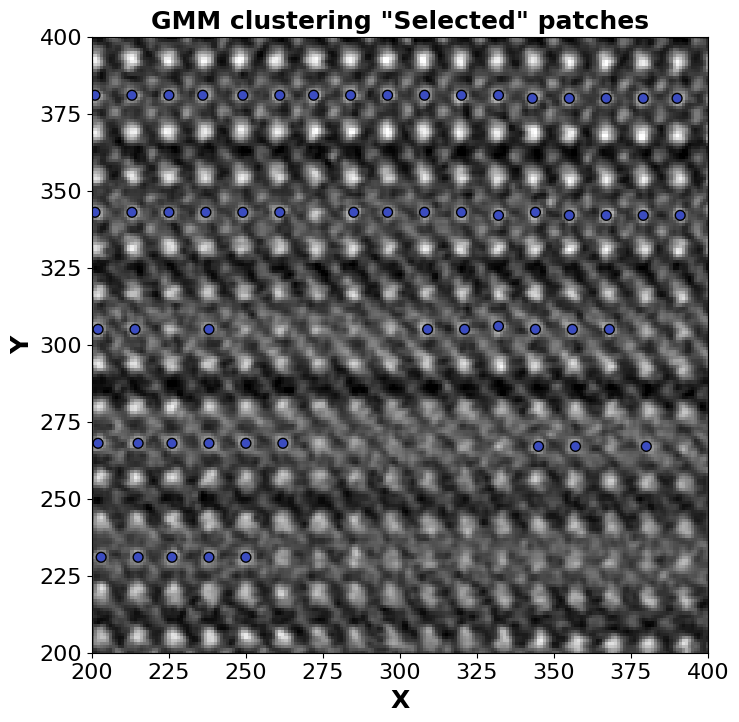

In [ ]:
# Plotting
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.imshow(img, cmap='gist_gray')

# Scatter plot with filtered data
imglab = ax.scatter(com_final[:, 1], com_final[:, 0], c=filtered_colors_2, s=50, cmap='coolwarm', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('X' , fontsize = 18, fontweight = "bold")
plt.ylabel('Y' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
x_min , x_max = 200, 400
y_min , y_max = 200, 400

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Scatter plot with filtered data
plt.show()

## VAE on selected classes:
* Example top Ba

In [ ]:
train_data = torch.tensor(imstack_final[:,:,:,0]).float()
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), batch_size=32, seed=0)

In [ ]:
train_data.shape

torch.Size([1578, 20, 20])

In [ ]:
in_dim = (window_size,window_size)

# Initialize vanilla VAE
vae = pv.models.iVAE(in_dim, latent_dim=2,   # Number of latent dimensions other than the invariancies
                     hidden_dim_e = [512, 512],   # corresponds to the number of neurons in the hidden layers of the encoder
                     hidden_dim_d = [512, 512],   # corresponds to the number of neurons in the hidden layers of the decoder
                     invariances=None, seed=0, sampler_d = 'continuous_bernoulli')
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae, seed=0)

# Train for n epochs:
for e in range(200):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: -102.1644
Epoch: 2 Training loss: -115.8301
Epoch: 3 Training loss: -116.0734
Epoch: 4 Training loss: -116.1786
Epoch: 5 Training loss: -116.2347
Epoch: 6 Training loss: -116.1247
Epoch: 7 Training loss: -116.1599
Epoch: 8 Training loss: -116.1544
Epoch: 9 Training loss: -116.1727
Epoch: 10 Training loss: -116.1888
Epoch: 11 Training loss: -116.0897
Epoch: 12 Training loss: -116.3471
Epoch: 13 Training loss: -116.4592
Epoch: 14 Training loss: -116.7942
Epoch: 15 Training loss: -116.7679
Epoch: 16 Training loss: -116.8045
Epoch: 17 Training loss: -116.7367
Epoch: 18 Training loss: -116.8413
Epoch: 19 Training loss: -116.8028
Epoch: 20 Training loss: -116.8748
Epoch: 21 Training loss: -116.8492
Epoch: 22 Training loss: -116.8796
Epoch: 23 Training loss: -116.8452
Epoch: 24 Training loss: -116.8650
Epoch: 25 Training loss: -116.8445
Epoch: 26 Training loss: -116.8584
Epoch: 27 Training loss: -116.8430
Epoch: 28 Training loss: -116.9311
Epoch: 29 Training loss: -117

Latent representation

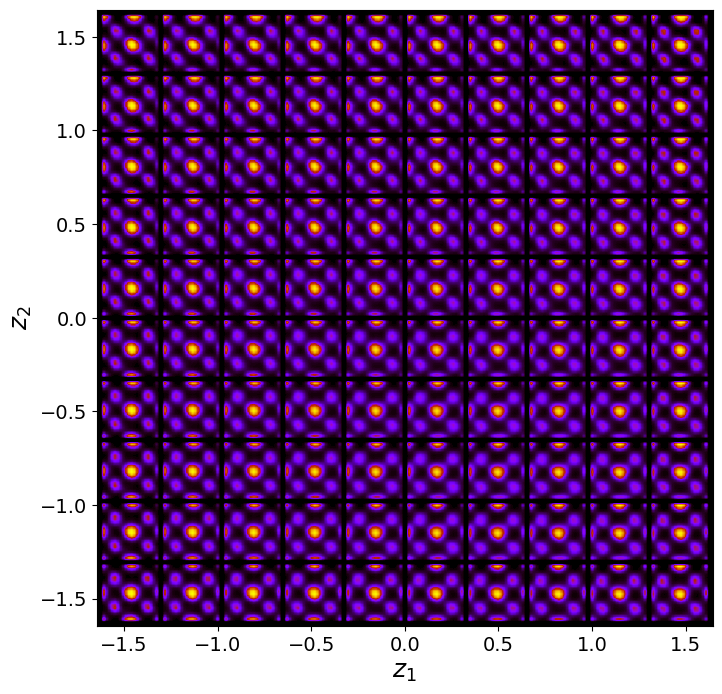

tensor([[[9.4172e-01, 6.7958e-01, 2.2032e-01,  ..., 4.8972e-04,
          1.9903e-03, 2.6960e-02],
         [6.0658e-01, 3.4539e-01, 1.0860e-01,  ..., 6.6364e-04,
          1.5403e-03, 1.5248e-02],
         [2.5748e-01, 1.4489e-01, 7.2202e-02,  ..., 5.0856e-03,
          3.7655e-03, 1.0910e-02],
         ...,
         [3.9186e-03, 2.4398e-03, 5.7298e-03,  ..., 1.4892e-01,
          1.0618e-01, 5.3136e-02],
         [2.4666e-02, 1.0807e-02, 7.4790e-03,  ..., 3.7301e-02,
          4.0099e-02, 4.3163e-02],
         [1.8898e-01, 5.9080e-02, 1.9851e-02,  ..., 7.2813e-03,
          1.5707e-02, 6.1615e-02]],

        [[9.4054e-01, 6.9995e-01, 2.6331e-01,  ..., 1.0053e-03,
          3.2406e-03, 3.5214e-02],
         [6.4867e-01, 3.9625e-01, 1.4080e-01,  ..., 1.0790e-03,
          2.4038e-03, 1.9652e-02],
         [2.9727e-01, 1.7833e-01, 8.5552e-02,  ..., 4.7048e-03,
          4.1716e-03, 1.4358e-02],
         ...,
         [4.4670e-03, 3.3011e-03, 7.2081e-03,  ..., 1.5377e-01,
          1.064

In [ ]:
vae.manifold2d(d=10)

Encoded data, plot the 2D scatter of the last two latent dimensions

Text(0, 0.5, '$z_2$')

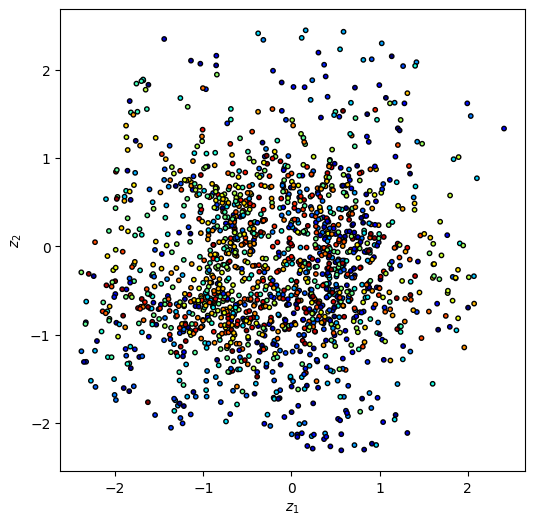

In [ ]:
z_mean, z_sd = vae.encode(train_data)

plt.figure(figsize=(6, 6))
plt.scatter(z_mean[:, -2], z_mean[:, -1], c=com_final[:, -1], s=10, cmap='jet', edgecolor='k')
plt.xlabel('$z_1$'); plt.ylabel('$z_2$')

In [ ]:
z1 = z_mean[:, -2]
z2 = z_mean[:, -1]
colors = np.sqrt(z1**2 + z2**2)

Scatttering overlay on the original image substrate

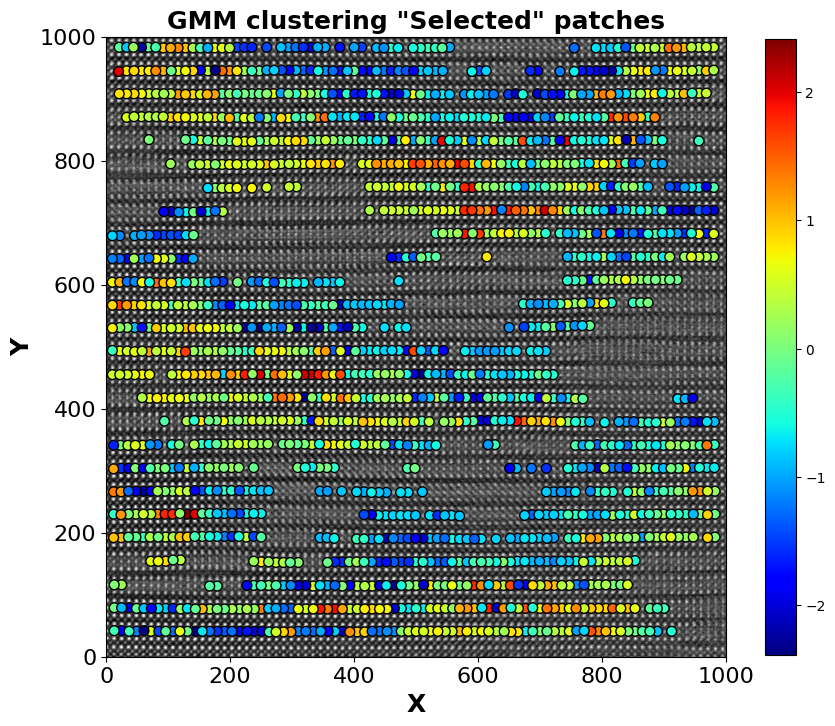

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(img_array, cmap='gist_gray')

x_min , x_max = 0, 1000
y_min , y_max = 0, 1000

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Scatter plot with filtered data
imglab = ax.scatter(com_final[:, 1], com_final[:, 0], c=z1, s=50, cmap='jet', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('X' , fontsize = 18, fontweight = "bold")
plt.ylabel('Y' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
fig.colorbar(imglab, shrink=.8)
# Scatter plot with filtered data
plt.show()

## VAE on all classes:

imstack_grid includes paches centered on all atoms

In [ ]:
imstack_grid, coms = Apply_LoG_2(window_size)

In [ ]:
train_data = torch.tensor(imstack_grid[:,:,:,0]).float()
train_loader = pv.utils.init_dataloader(train_data.unsqueeze(1), batch_size=32, seed=0)

In [ ]:
train_data.shape

torch.Size([12106, 20, 20])

In [ ]:
in_dim = (window_size,window_size)

# Initialize vanilla VAE
vae = pv.models.iVAE(in_dim, latent_dim=2,   # Number of latent dimensions other than the invariancies
                     hidden_dim_e = [512, 512],   # corresponds to the number of neurons in the hidden layers of the encoder
                     hidden_dim_d = [512, 512],   # corresponds to the number of neurons in the hidden layers of the decoder
                     invariances=None, seed=0, sampler_d = 'continuous_bernoulli')
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(vae, seed=0)

# Train for n epochs:
for e in range(100):
    trainer.step(train_loader)
    trainer.print_statistics()

Epoch: 1 Training loss: -130.0866
Epoch: 2 Training loss: -142.9970
Epoch: 3 Training loss: -144.8126
Epoch: 4 Training loss: -145.8091
Epoch: 5 Training loss: -146.2032
Epoch: 6 Training loss: -146.6925
Epoch: 7 Training loss: -146.7956
Epoch: 8 Training loss: -146.6202
Epoch: 9 Training loss: -146.9795
Epoch: 10 Training loss: -147.2227
Epoch: 11 Training loss: -147.2058
Epoch: 12 Training loss: -147.7005
Epoch: 13 Training loss: -147.3848
Epoch: 14 Training loss: -147.0334
Epoch: 15 Training loss: -148.0060
Epoch: 16 Training loss: -147.3472
Epoch: 17 Training loss: -146.6950
Epoch: 18 Training loss: -147.5871
Epoch: 19 Training loss: -147.2900
Epoch: 20 Training loss: -147.7045
Epoch: 21 Training loss: -147.8644
Epoch: 22 Training loss: -147.4366
Epoch: 23 Training loss: -147.6747
Epoch: 24 Training loss: -147.4844
Epoch: 25 Training loss: -147.5302
Epoch: 26 Training loss: -146.7649
Epoch: 27 Training loss: -147.2467
Epoch: 28 Training loss: -147.4205
Epoch: 29 Training loss: -147

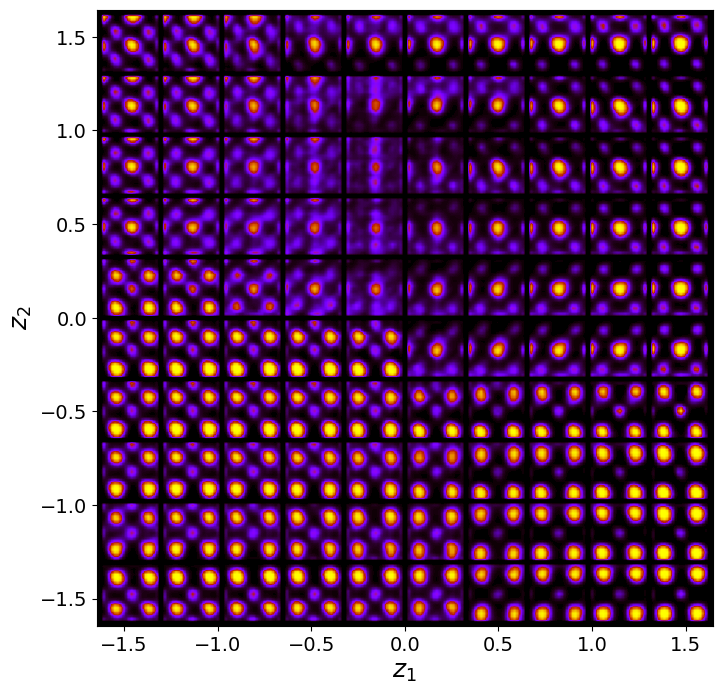

tensor([[[0.9604, 0.6836, 0.2105,  ..., 0.0014, 0.0078, 0.1177],
         [0.7844, 0.3573, 0.0804,  ..., 0.0015, 0.0056, 0.0476],
         [0.3171, 0.1027, 0.0365,  ..., 0.0046, 0.0068, 0.0266],
         ...,
         [0.0020, 0.0022, 0.0119,  ..., 0.2175, 0.1048, 0.0385],
         [0.0053, 0.0034, 0.0071,  ..., 0.0737, 0.0467, 0.0385],
         [0.0345, 0.0138, 0.0109,  ..., 0.0184, 0.0246, 0.0703]],

        [[0.9301, 0.5959, 0.1855,  ..., 0.0029, 0.0105, 0.1166],
         [0.7774, 0.3829, 0.1017,  ..., 0.0033, 0.0091, 0.0580],
         [0.4386, 0.1594, 0.0528,  ..., 0.0065, 0.0100, 0.0400],
         ...,
         [0.0031, 0.0026, 0.0117,  ..., 0.1920, 0.1012, 0.0483],
         [0.0039, 0.0024, 0.0056,  ..., 0.0883, 0.0578, 0.0508],
         [0.0203, 0.0078, 0.0071,  ..., 0.0315, 0.0337, 0.0787]],

        [[0.8274, 0.4694, 0.1786,  ..., 0.0081, 0.0161, 0.1141],
         [0.6893, 0.3611, 0.1336,  ..., 0.0100, 0.0155, 0.0695],
         [0.4603, 0.1919, 0.0789,  ..., 0.0195, 0.0181, 0.

In [ ]:
vae.manifold2d(d=10)

Encoded data, plot the 2D scatter of the last two latent dimensions

Text(0, 0.5, '$z_2$')

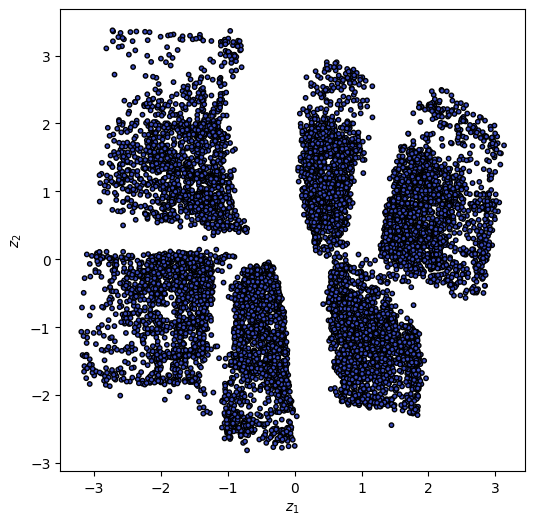

In [ ]:
z_mean, z_sd = vae.encode(train_data)

plt.figure(figsize=(6, 6))
plt.scatter(z_mean[:, -2], z_mean[:, -1], c=coms[:, -1], s=10, cmap='coolwarm', edgecolor='k')
plt.xlabel('$z_1$'); plt.ylabel('$z_2$')

In [ ]:
z1 = z_mean[:, -2]
z2 = z_mean[:, -1]
colors = np.sqrt(z1**2 + z2**2)

Scatttering overlay on the original image substrate

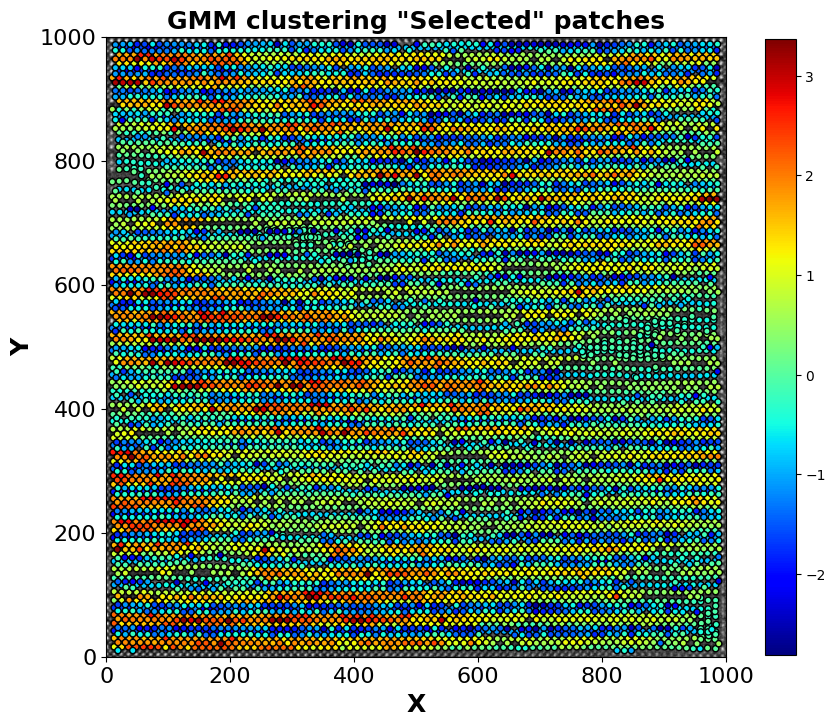

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(img_array, cmap='gist_gray')

x_min , x_max = 0, 1000
y_min , y_max = 0, 1000

ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Scatter plot with filtered data
imglab = ax.scatter(coms[:, 1], coms[:, 0], c=z2, s=20, cmap='jet', edgecolor='k')
plt.title('GMM clustering "Selected" patches' , fontsize = 18, fontweight = "bold")
plt.xlabel('X' , fontsize = 18, fontweight = "bold")
plt.ylabel('Y' , fontsize = 18, fontweight = "bold")
plt.tick_params(axis='both', which='major', labelsize=16)
fig.colorbar(imglab, shrink=.8)
# Scatter plot with filtered data
plt.show()